In [1]:
%load_ext autoreload
%autoreload 2
import tensorflow as tf
from tensorflow.python.ops import array_ops
import numpy as np
import matplotlib.pyplot as plt
import processes
from processes import orstein_uhlenbeck as ou
import utils
from utils import kalman
import buildingblocks
from buildingblocks import stupidcell

/Users/apple/anaconda3/envs/DeepLearning/lib/python3.5/importlib/_bootstrap.py:222: RuntimeWarning: compiletime version 3.6 of module 'tensorflow.python.framework.fast_tensor_util' does not match runtime version 3.5
  return f(*args, **kwds)
/Users/apple/anaconda3/envs/DeepLearning/lib/python3.5/site-packages/h5py/__init__.py:36: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  from ._conv import register_converters as _register_converters


## Network

In [2]:
def build_optimizer(loss, learning_rate, grad_clip):
    ''' Build optmizer for training, using gradient clipping.
    
        Arguments:
        loss: Network loss
        learning_rate: Learning rate for optimizer
    
    '''
    
    # Optimizer for training, using gradient clipping to control exploding gradients
    tvars = tf.trainable_variables()
    grads, _ = tf.clip_by_global_norm(tf.gradients(loss, tvars), grad_clip)
    train_op = tf.train.AdamOptimizer(learning_rate)
    optimizer = train_op.apply_gradients(zip(grads, tvars))
    
    return optimizer

In [3]:

graph=tf.Graph()


In [4]:
logs_dir = './graphs/'
batch_size=128
num_steps=1095
lstm_layers= 1
lstm_size= 10
inputs_dim= 1
alpha = 0.1

In [5]:
with graph.as_default():
    inputs_ = tf.placeholder( tf.float32, [batch_size,num_steps, inputs_dim] , name='inputs')
    targets_ = tf.placeholder( tf.float32, [batch_size,num_steps, inputs_dim] , name='targets')
    learning_rate= tf.placeholder( tf.float32 , name='lr')
    grad_clip= tf.placeholder( tf.float32 , name='clip')

In [6]:

with graph.as_default():
    cell = stupidcell.StupidRNNCell(1,activation= None)
    
    '''
    stupidlstm = stupidcell.StupidLSTMCell(lstm_size)
    lstm = tf.contrib.rnn.BasicLSTMCell(lstm_size)
    lstm= tf.contrib.rnn.MultiRNNCell([lstm,stupidlstm])
    '''
    lstm1 = tf.contrib.rnn.BasicLSTMCell(lstm_size)
    lstm2 = tf.contrib.rnn.BasicLSTMCell(lstm_size)
    lstm= tf.contrib.rnn.MultiRNNCell([lstm1,lstm2])
    W = tf.Variable(tf.random_normal([lstm_size, lstm_size]), dtype=tf.float32) # weights
    b = tf.Variable(tf.random_normal([ lstm_size]), dtype=tf.float32)
    def residual_wrapper( i,o):
        out = tf.matmul( o, W)+b
        out = tf.sigmoid( out)
        return array_ops.concat([i,out],1)
    lstm = tf.contrib.rnn.ResidualWrapper( lstm, (lambda i, o: array_ops.concat([i,o],1)) )
    
    rnn_cell = tf.contrib.rnn.MultiRNNCell([lstm,cell])
# 'outputs' is a tensor of shape [batch_size, max_time, cell_state_size]

# defining initial state
    initial_state = rnn_cell.zero_state(batch_size, dtype=tf.float32)

# 'state' is a tensor of shape [batch_size, cell_state_size]
    outputs, state = tf.nn.dynamic_rnn(rnn_cell, inputs_,
                                   initial_state=initial_state,
                                   dtype=tf.float32)
    '''
    W = tf.Variable(tf.random_normal([lstm_size, inputs_dim]), dtype=tf.float32) # weights
    b = tf.Variable(tf.random_normal([ inputs_dim]), dtype=tf.float32) # biases
    shape = outputs.shape
    
    outputs = tf.matmul( tf.reshape( outputs, [-1, lstm_size]), W ) + b
    outputs = tf.reshape( outputs, (shape[0],shape[1],b.shape[0]))
    '''


(128, 2)


In [7]:
with graph.as_default():
    square=  tf.reduce_mean( tf.square( outputs - targets_),axis=0 )
    shape = square.shape
    square = tf.reshape(square, [shape[0],])
    def power(x):
        alpha =0.96
        return (1-alpha)*tf.pow(alpha,x)
    weights = tf.map_fn(  power, tf.range( start= shape[0]-1, delta=-1., limit= -0.5  ) )
    cost = tf.losses.compute_weighted_loss( square, weights )
    optimizer= build_optimizer(cost, learning_rate, grad_clip)
    

## Batch

In [8]:


def batch_1( batch_size, num_steps, noise, dictionary,):
    while True:
        invariant_std = 0.3 +0.6*np.random.rand()
        rand = np.random.rand()
        lbd = 10**( 2*rand**2 -1 )
        sigma = invariant_std*np.sqrt(2*lbd)
        dictionary['sigma'] = sigma
        dictionary['lbd'] = lbd

        batch = np.random.randn( batch_size,num_steps+1,1)*noise
        trend =np.reshape( ou.process(**dictionary)[: num_steps+1] , [-1,1] )
        for i in range(batch_size):
            batch[i,:,:]=batch[i,:,:]+trend[:,:]
        
        yield (batch[:,:-1,:] , batch[:,1:,:],trend, dictionary )

    

In [9]:
invariant_std = 0.2
lbd = 1.
sigma = invariant_std*np.sqrt(2*lbd)
start= 365
dictionary = {'deltaT': 1./365,
              'T':3}
noise= 0.1/np.sqrt( dictionary['deltaT'])
generator1 = batch_1( batch_size , num_steps,noise ,dictionary)

In [10]:
generator= generator1

## Training

## Batch 1

-3.646366230770947


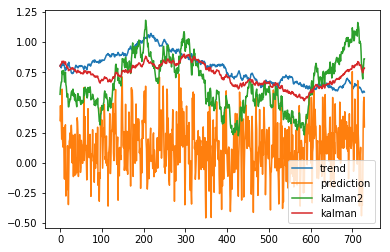

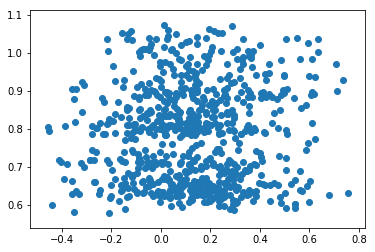

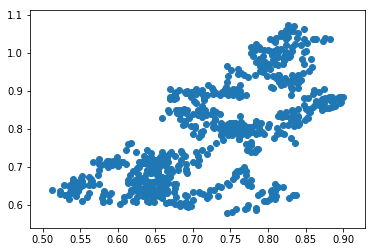

-3.6465191192459327


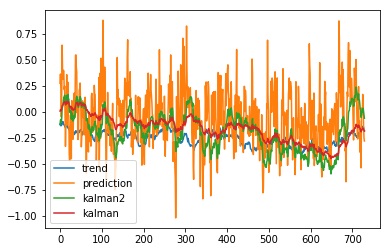

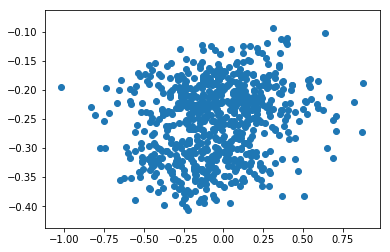

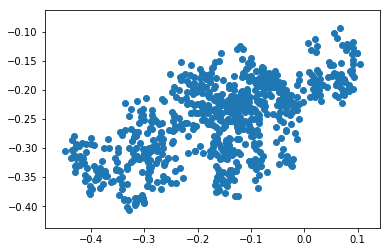

-3.646572901727633


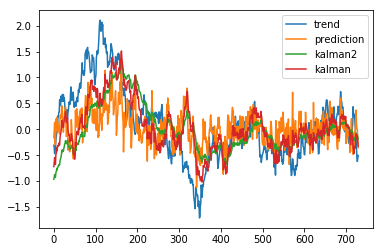

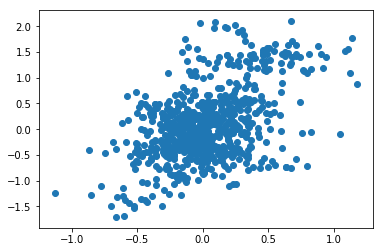

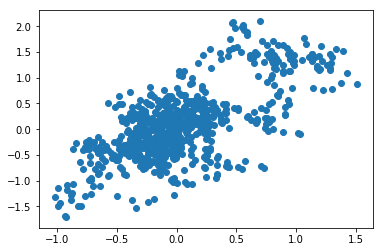

-3.6466673464514328


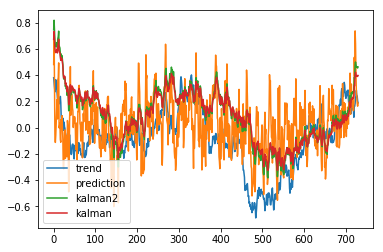

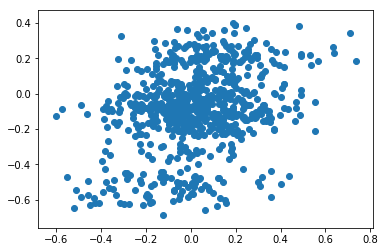

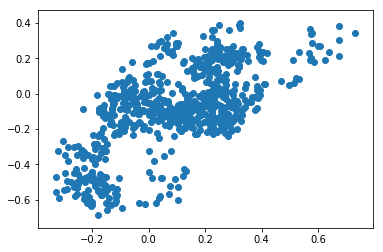

-3.646416536625476


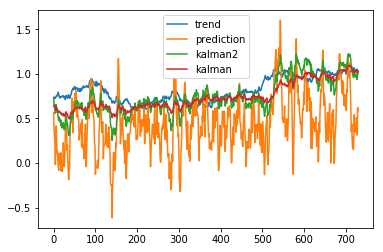

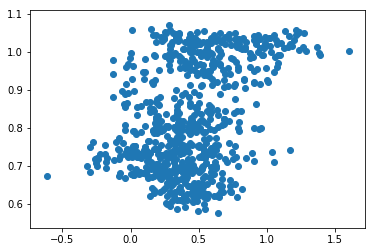

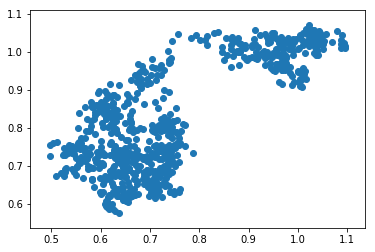

-3.646501949382947


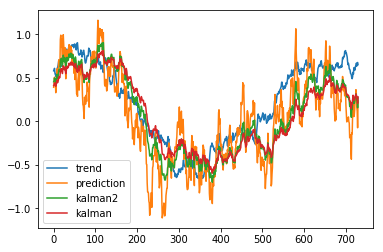

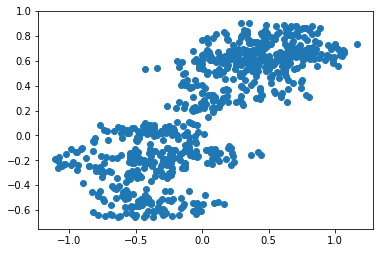

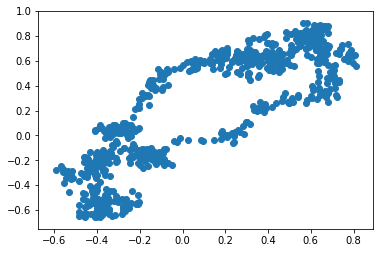

-3.646485953452067


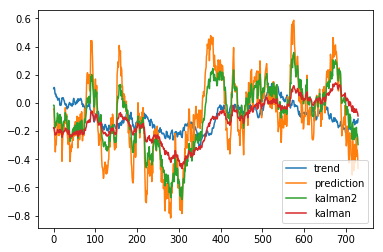

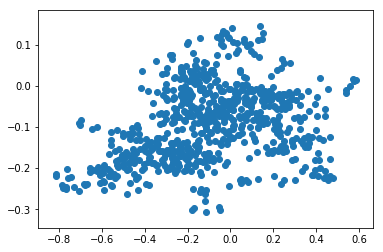

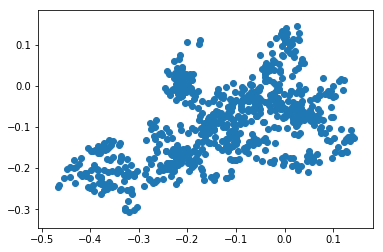

-3.646631348039956


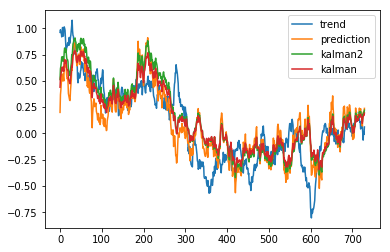

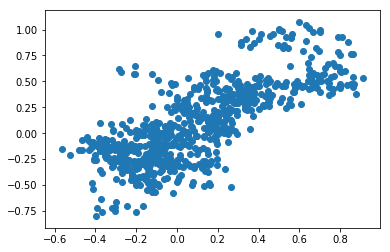

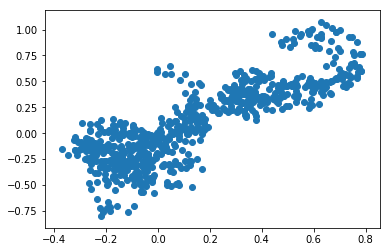

-3.6465976586099726


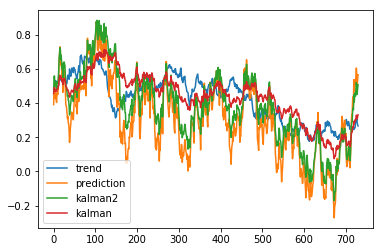

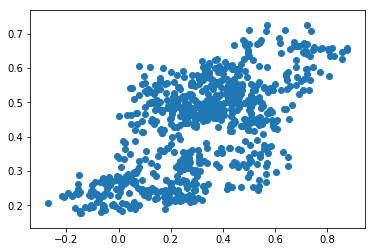

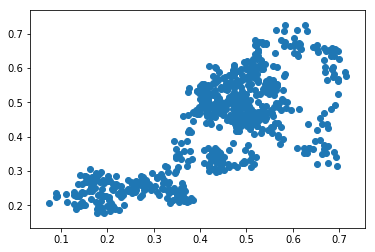

-3.6465823453385395


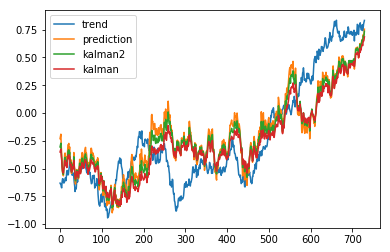

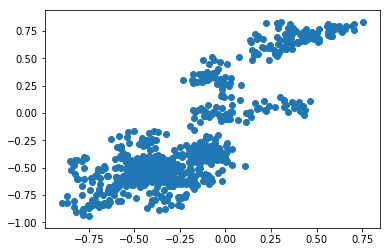

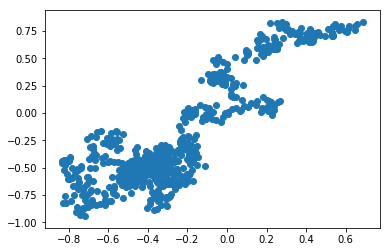

-3.6466319608502102


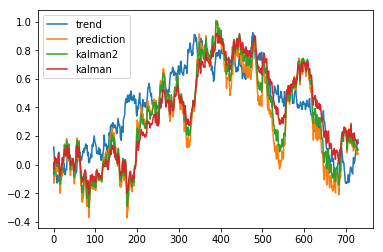

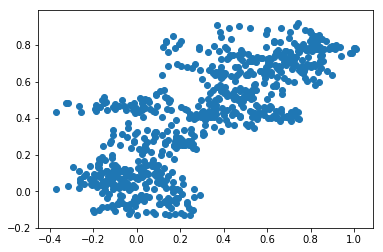

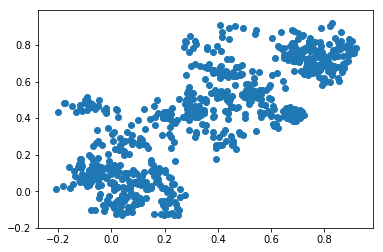

-3.6467089879792196


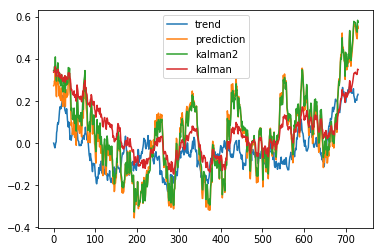

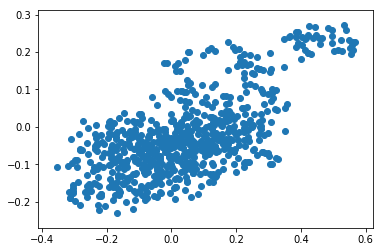

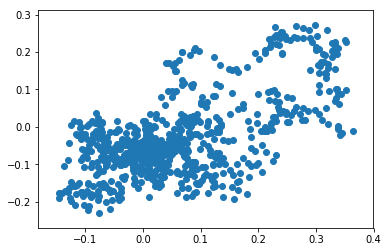

-3.646562730986626


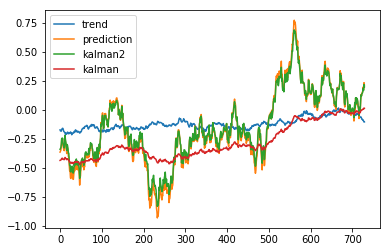

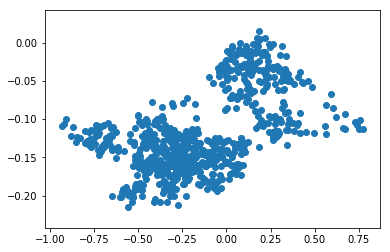

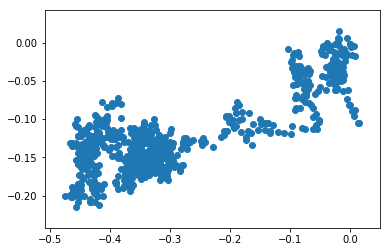

-3.6465590429492307


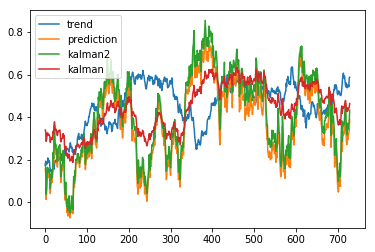

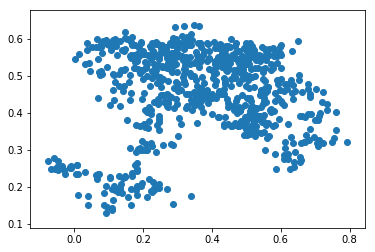

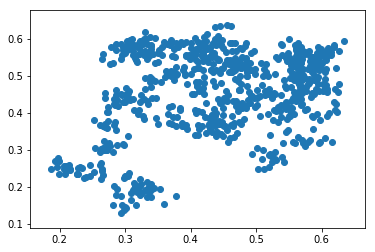

-3.646700230985881


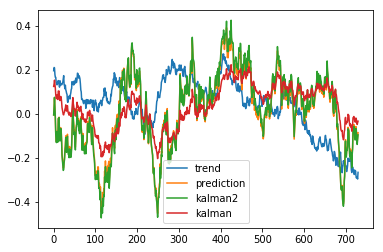

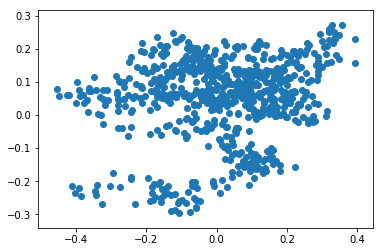

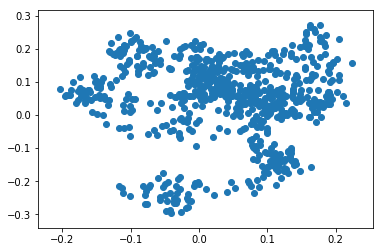

-3.6464818288572145


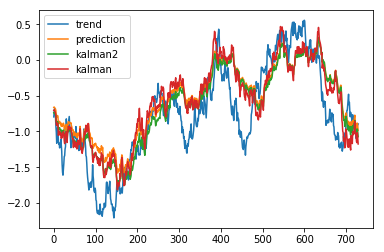

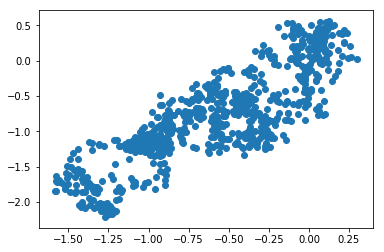

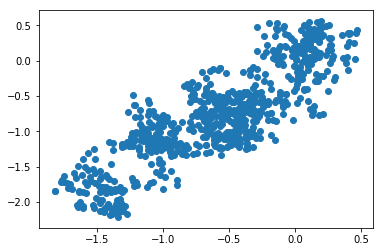

-3.6466081827878964


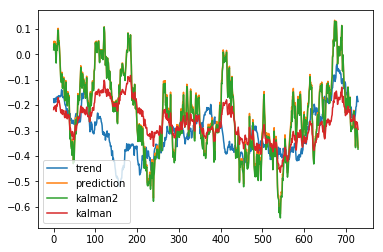

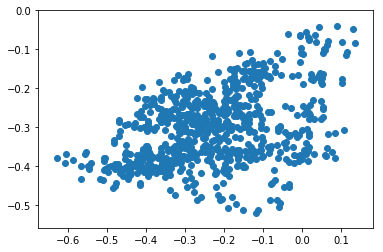

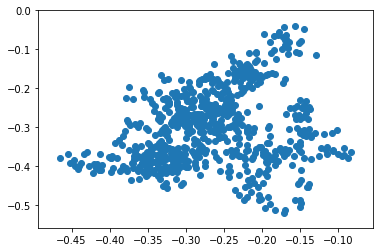

-3.6465871674940002


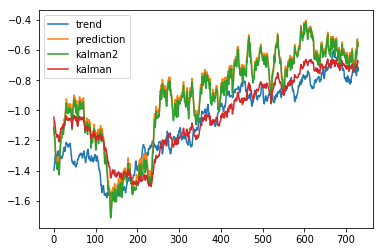

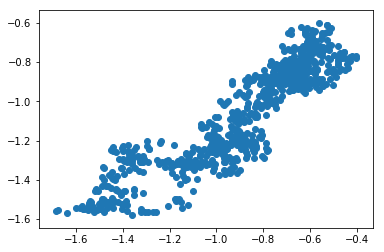

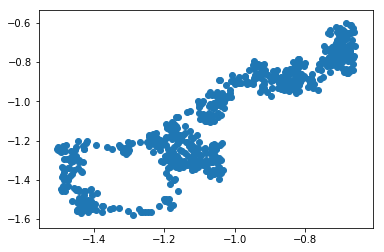

-3.646497962391005


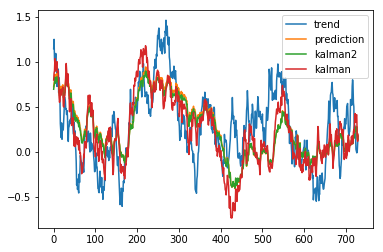

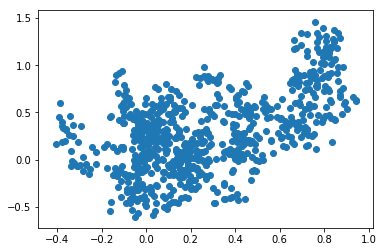

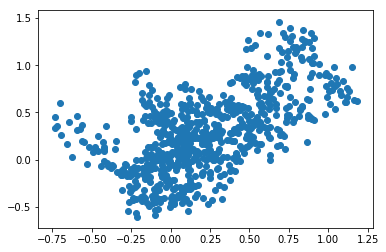

-3.6466274385806186


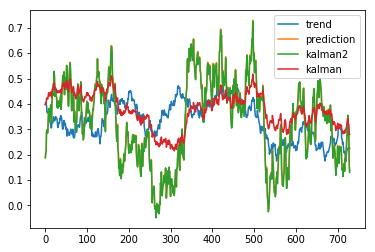

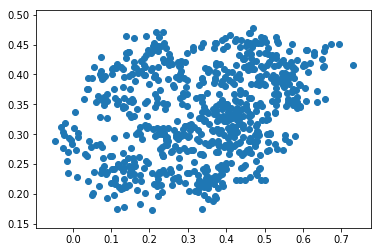

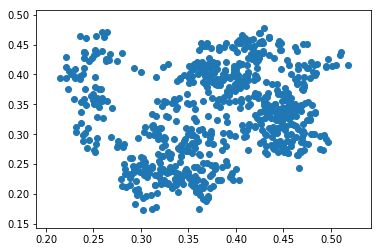

-3.645909840334208


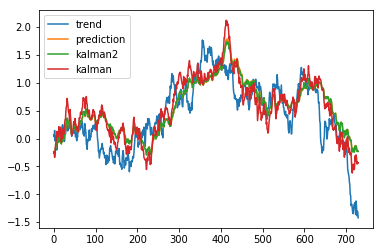

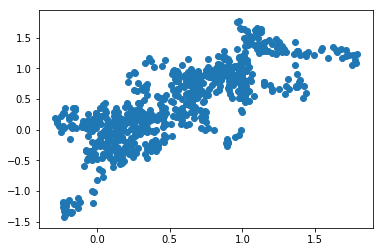

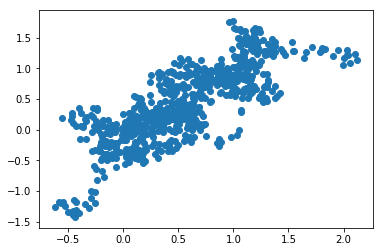

-3.646578776976095


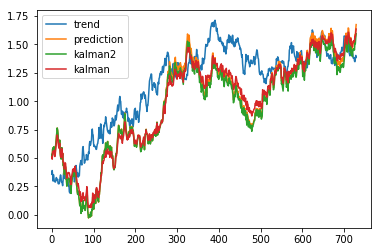

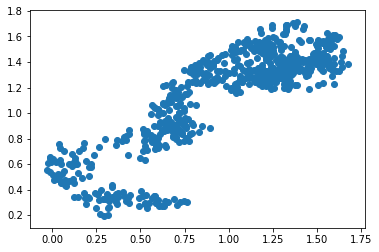

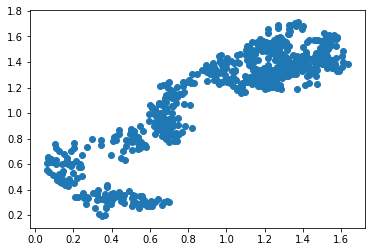

-3.646557962847875


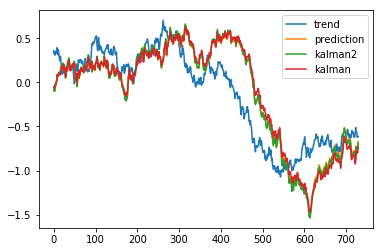

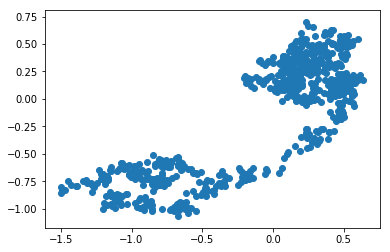

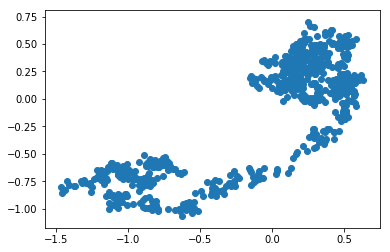

-3.6466367369052035


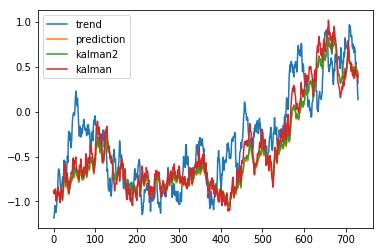

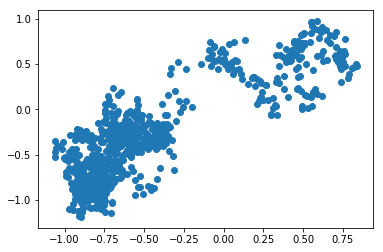

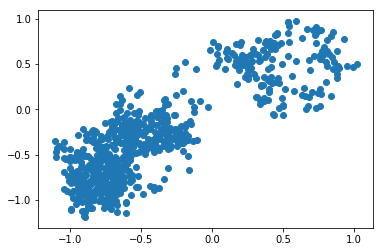

-3.6465935167856527


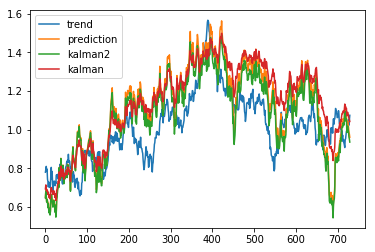

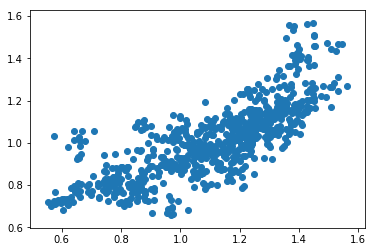

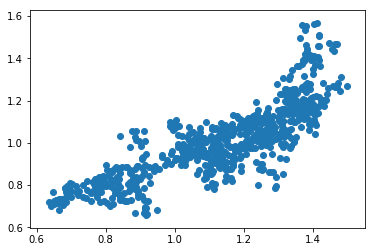

-3.6465917947702122


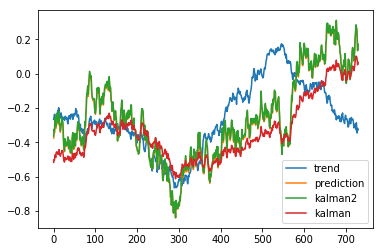

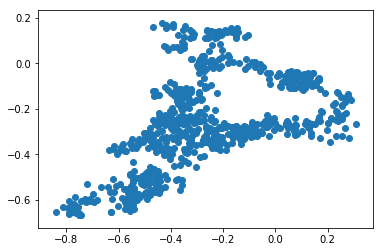

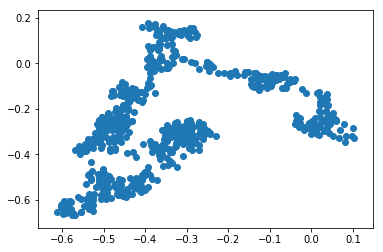

-3.646653580805288


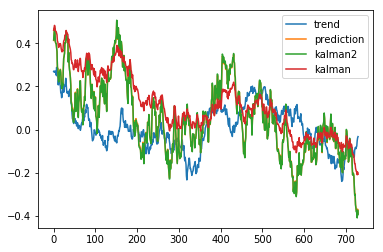

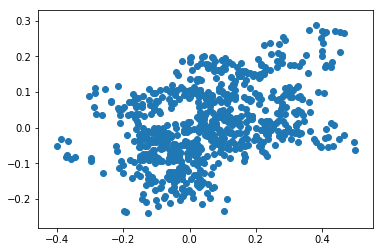

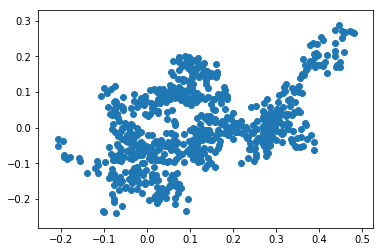

-3.6465558741241706


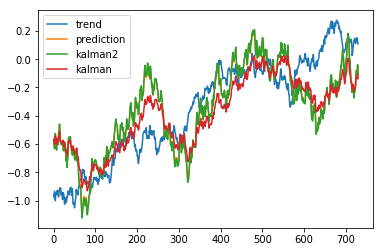

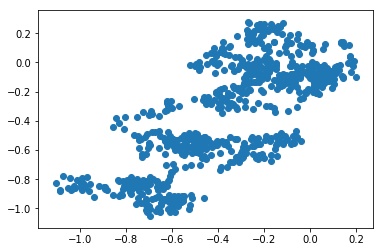

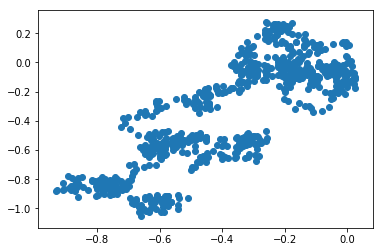

-3.6465609791688633


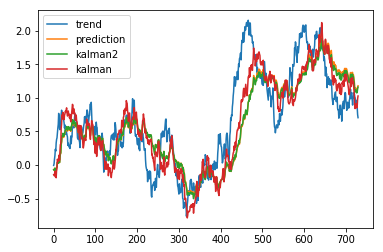

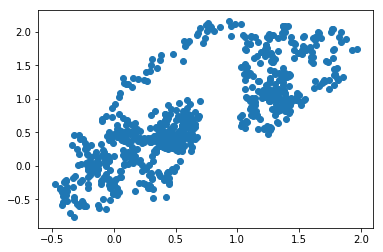

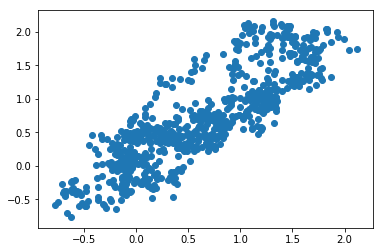

-3.6465368043631328


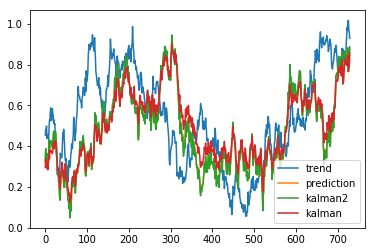

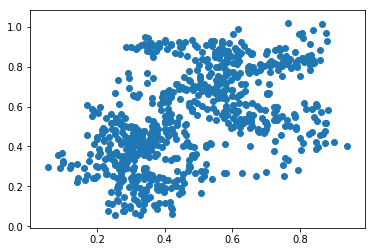

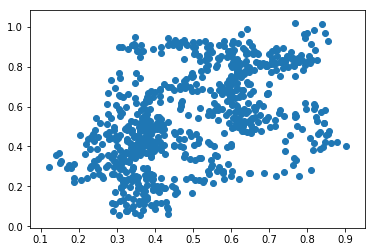

-3.6466775844804955


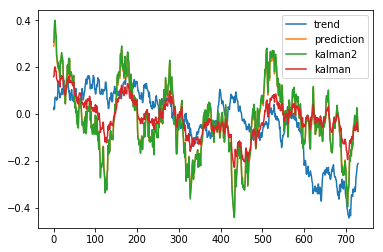

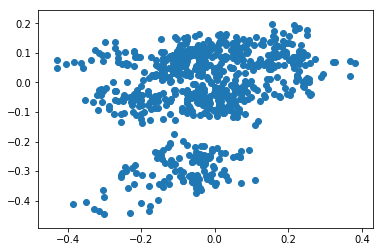

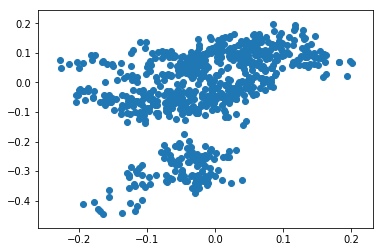

-3.6465713240671915


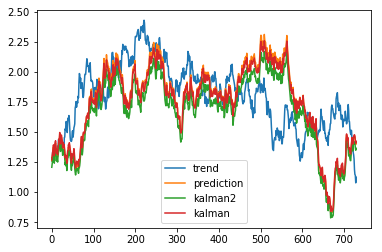

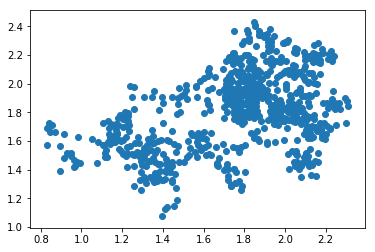

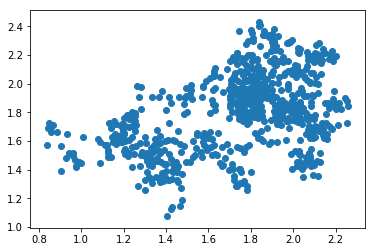

-3.646635858435185


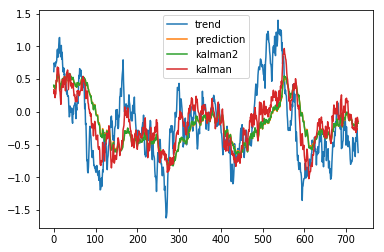

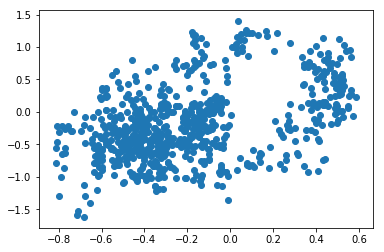

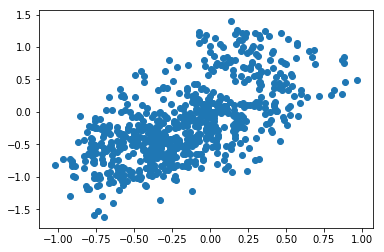

-3.6466232092119766


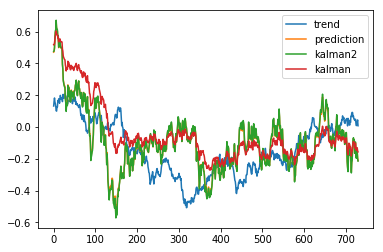

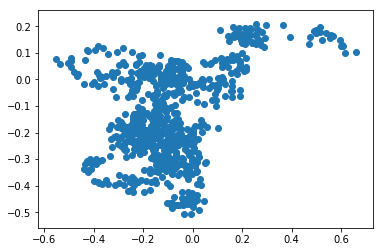

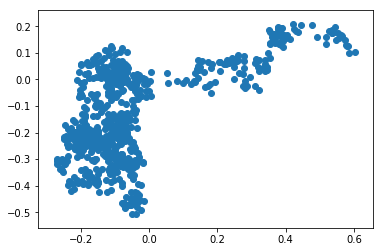

-3.6466717460192752


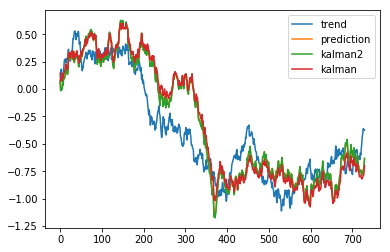

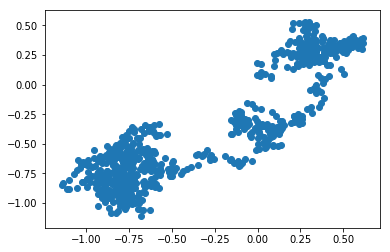

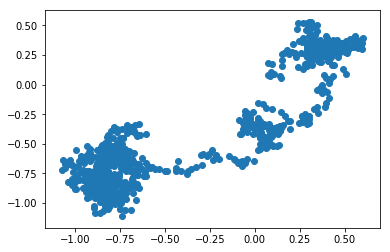

-3.6466871989890945


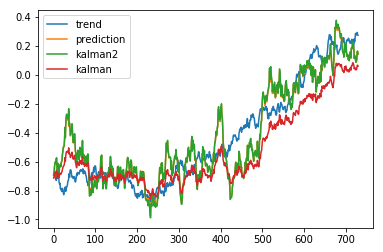

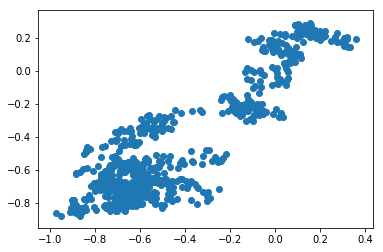

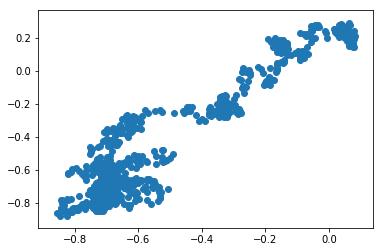

-3.6466025871690375


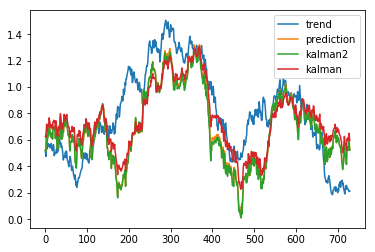

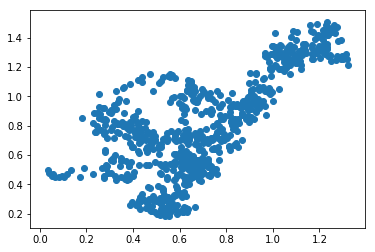

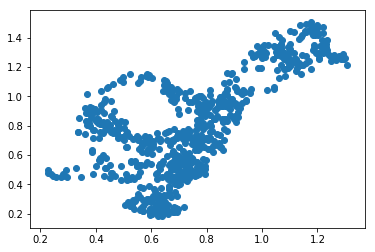

-3.646609632391484


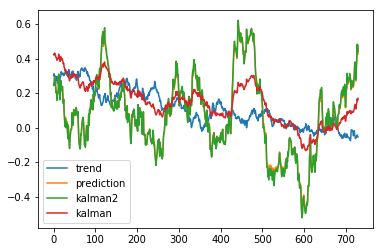

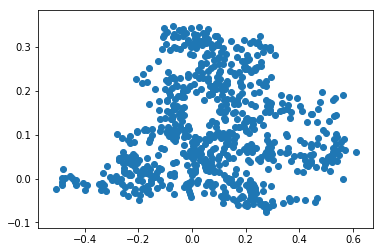

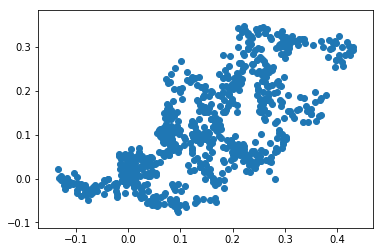

-3.646587154455484


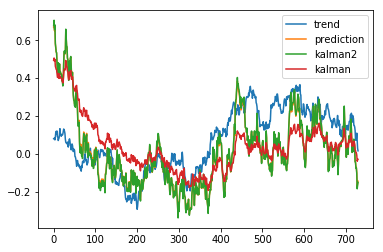

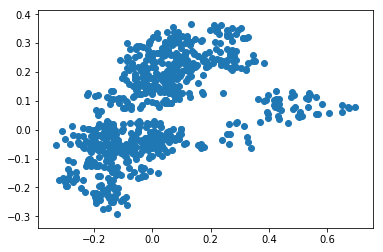

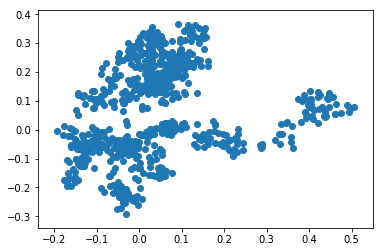

-3.6466311228927237


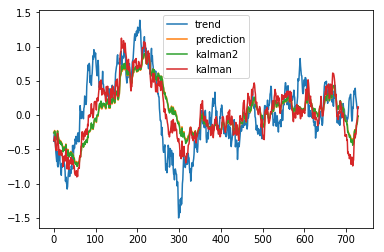

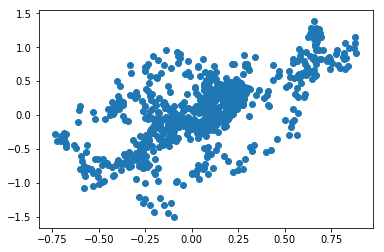

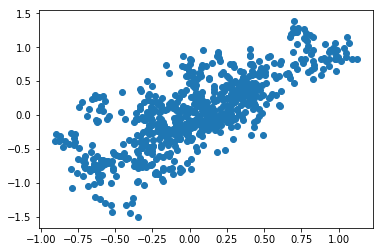

-3.646630096342416


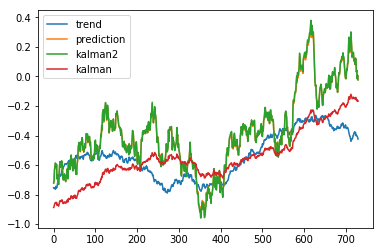

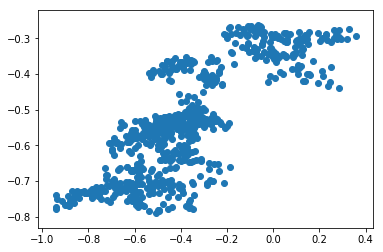

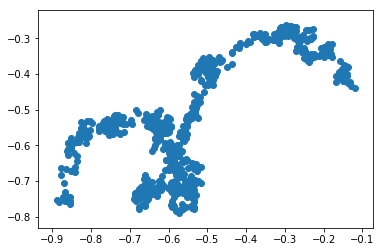

-3.6466760228853685


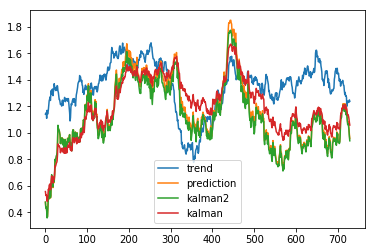

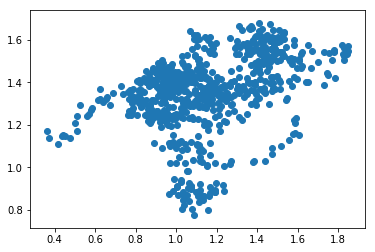

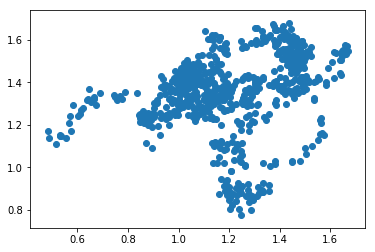

-3.6466378025710595


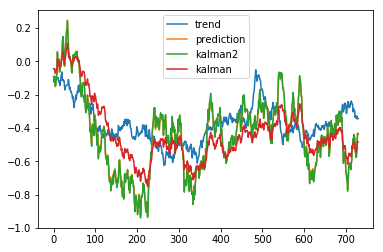

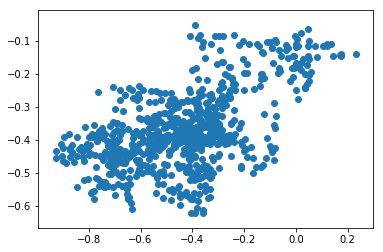

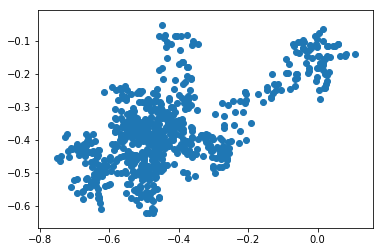

-3.64661726714112


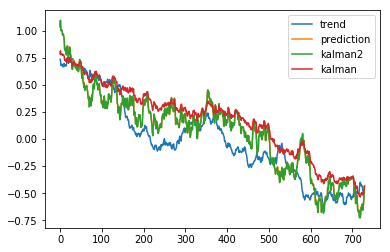

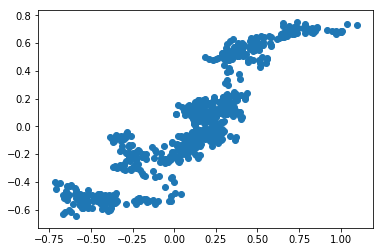

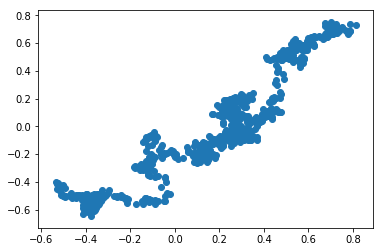

-3.6465884799603385


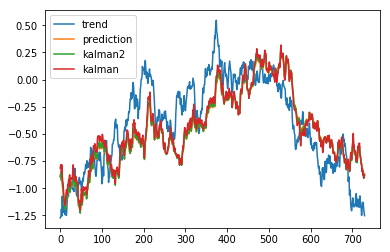

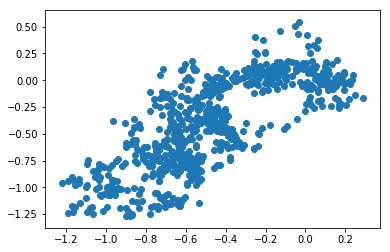

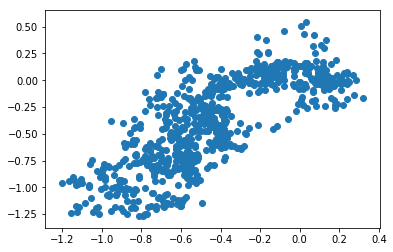

-3.646553648496048


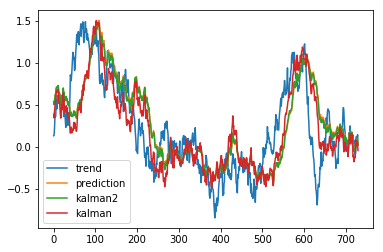

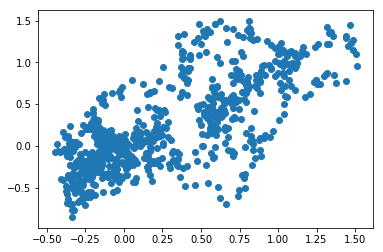

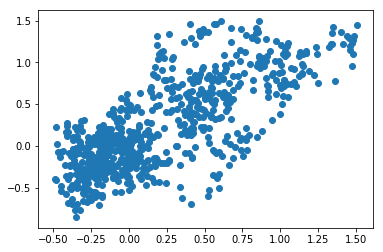

-3.6466577563900513


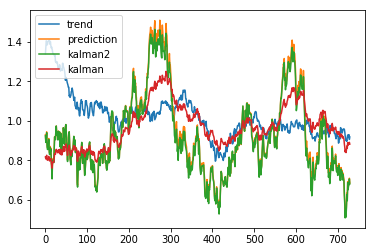

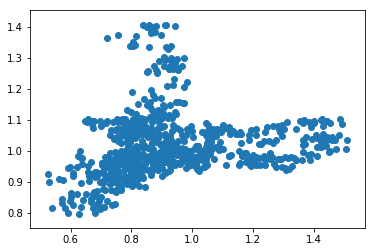

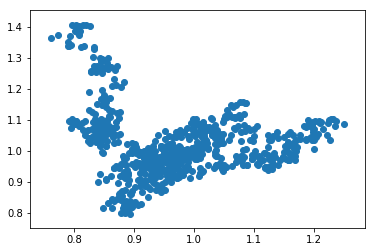

-3.6464893956203026


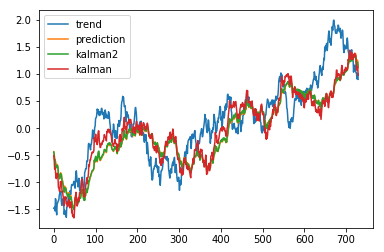

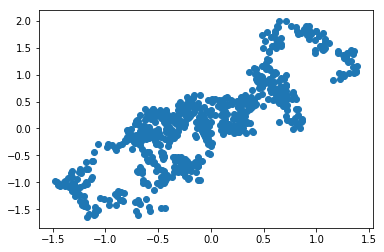

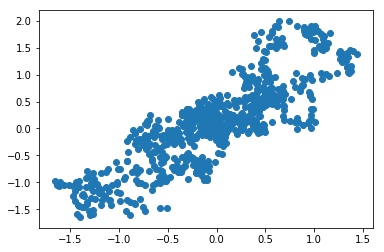

-3.6466345063876373


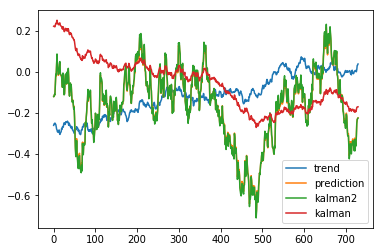

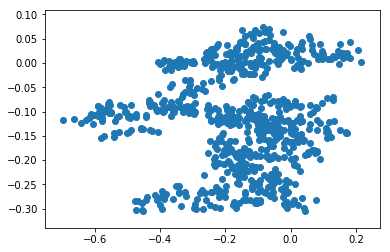

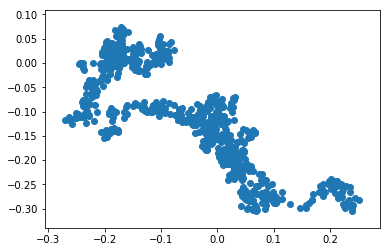

-3.6464085526298744


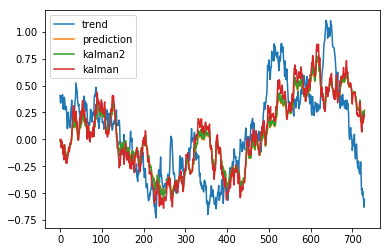

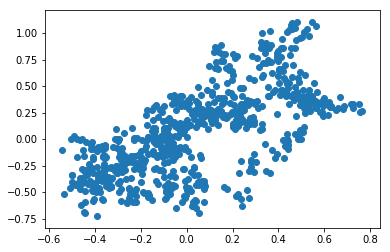

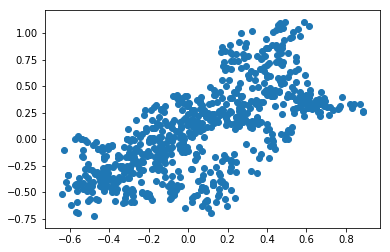

-3.6467083092778934


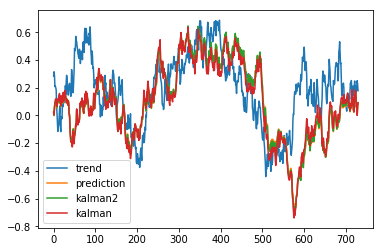

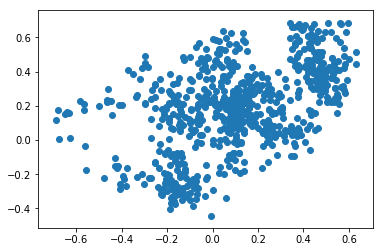

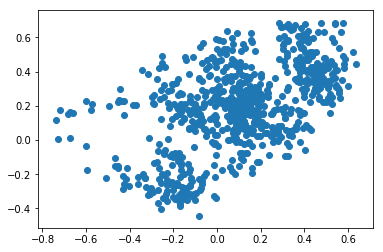

-3.6466771670151514


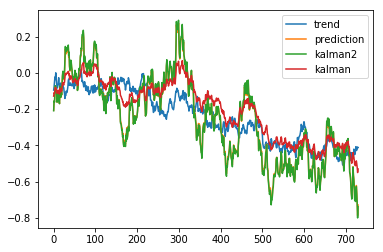

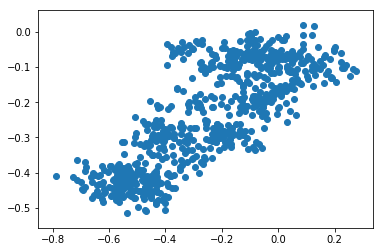

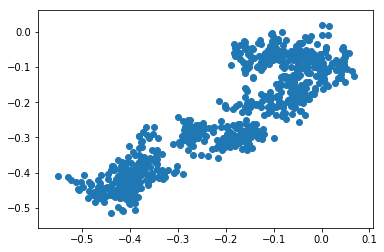

-3.6466651655267937


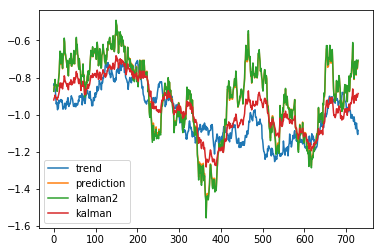

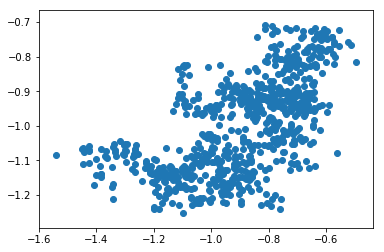

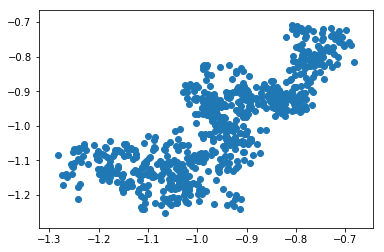

-3.6465448514558387


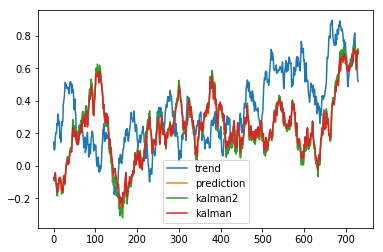

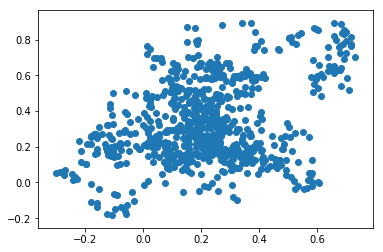

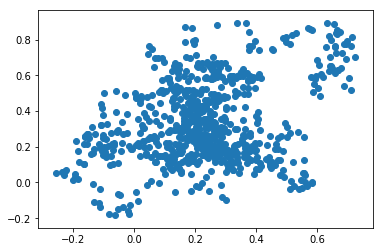

-3.646608992107214


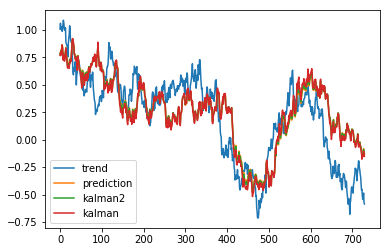

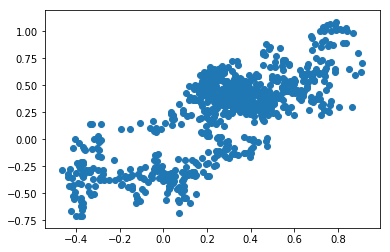

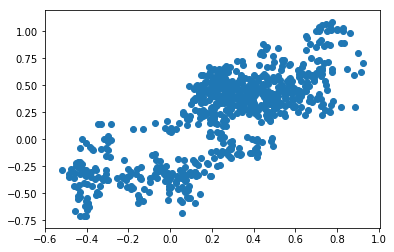

-3.646527811745183


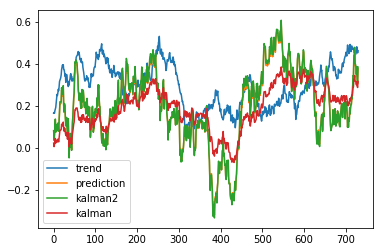

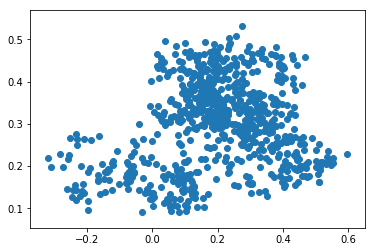

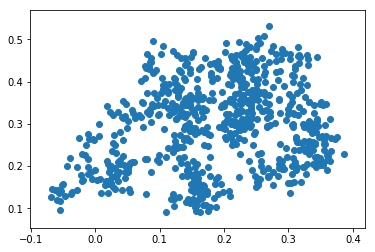

-3.6466109921224428


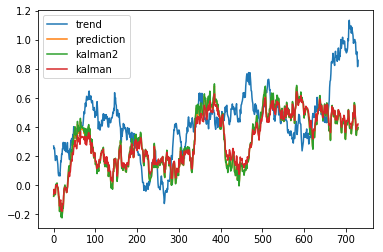

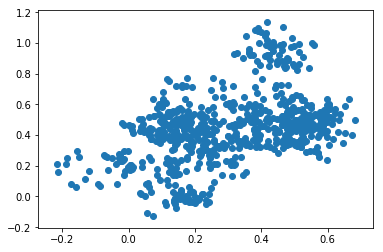

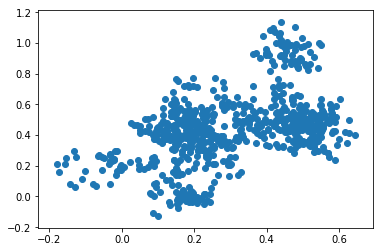

-3.6466779535170657


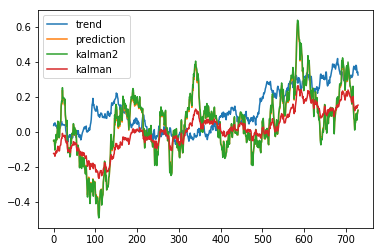

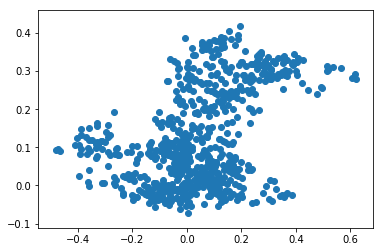

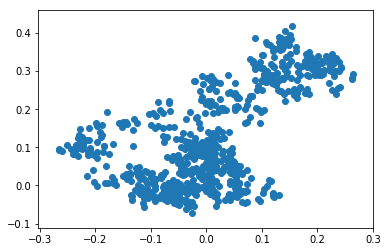

-3.6464916622266186


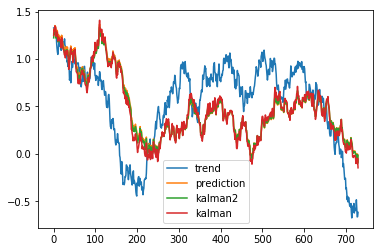

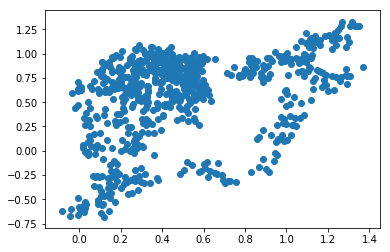

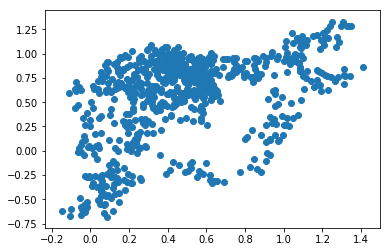

-3.646605440974237


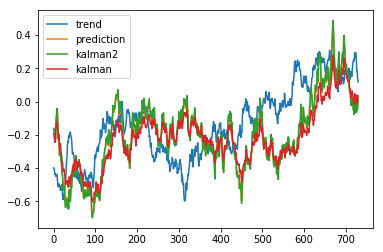

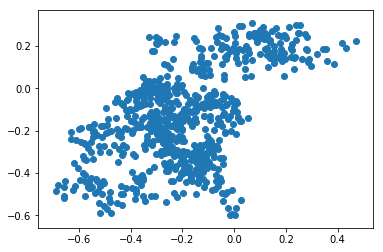

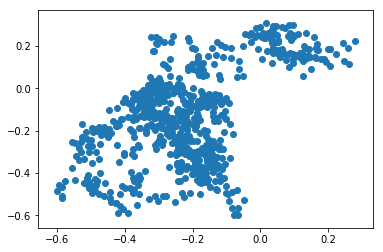

-3.646614870382474


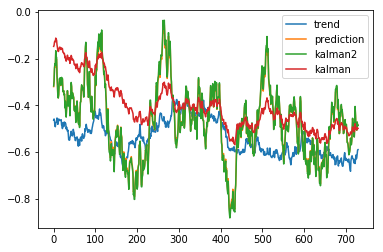

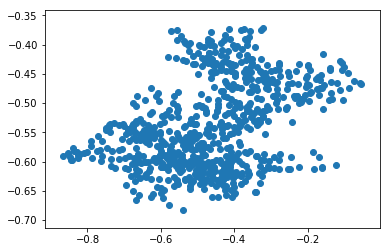

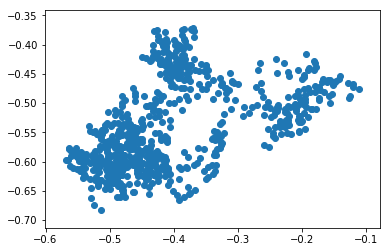

-3.6466225037351263


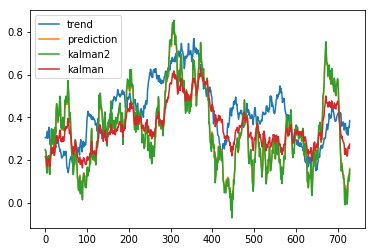

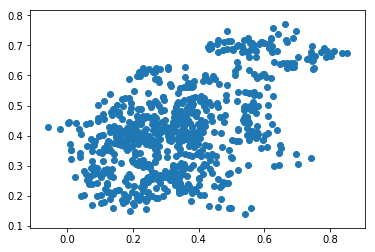

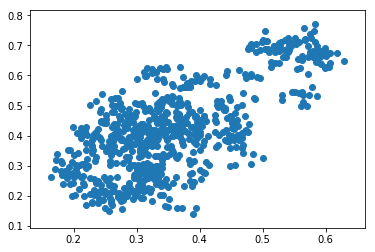

-3.6465026325080556


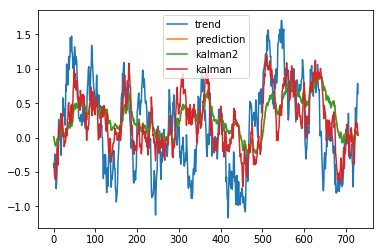

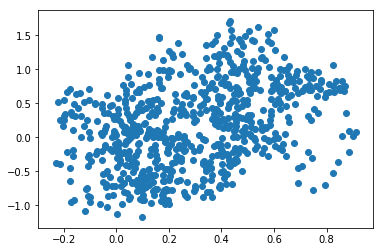

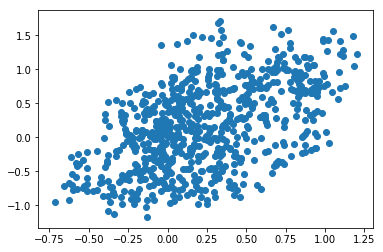

-3.646599326608704


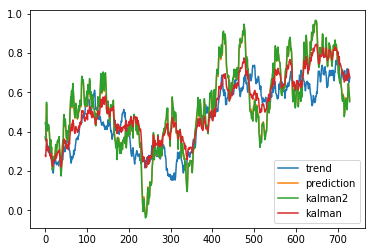

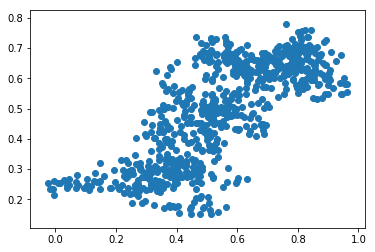

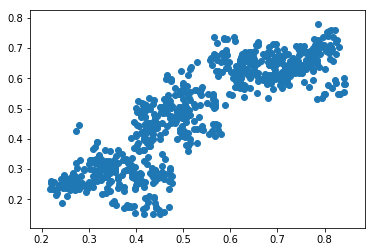

-3.646720792492853


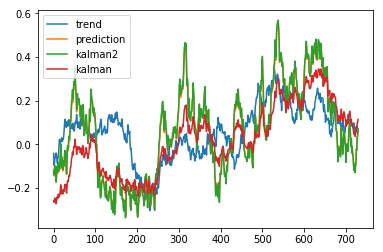

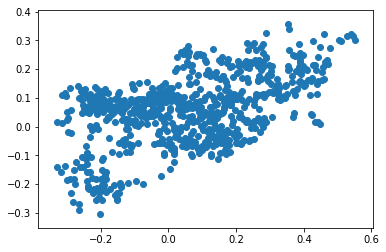

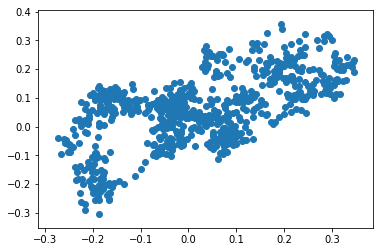

-3.6465142738074077


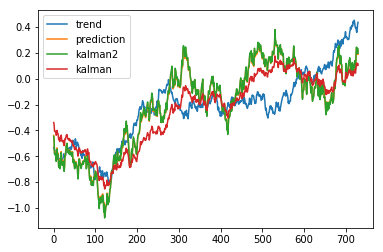

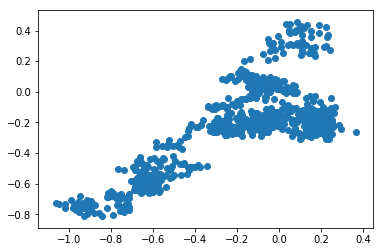

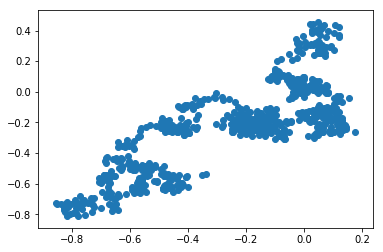

-3.64660207796842


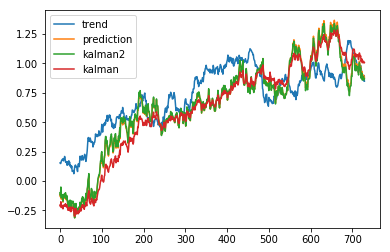

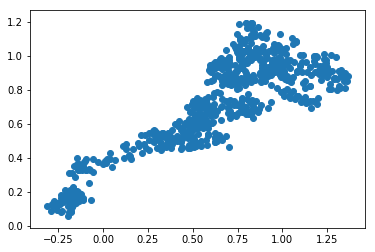

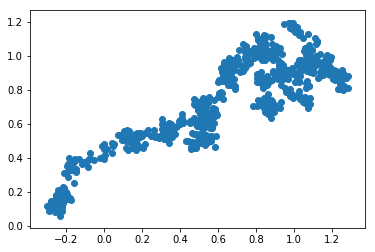

-3.646683955891059


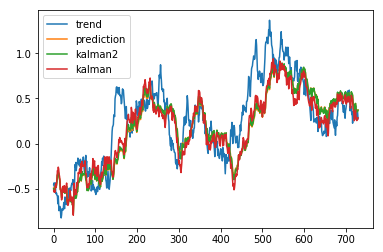

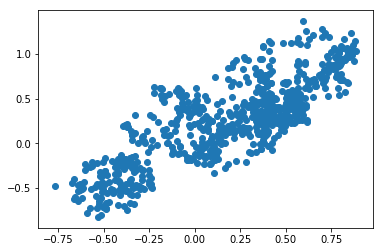

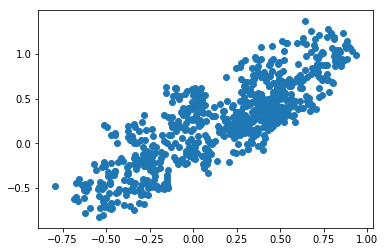

-3.6466296209022415


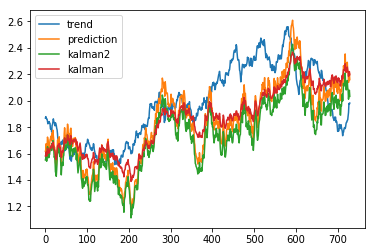

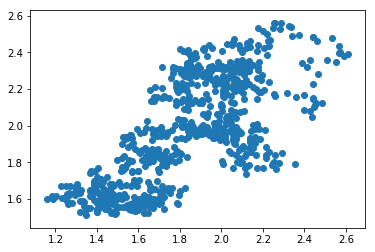

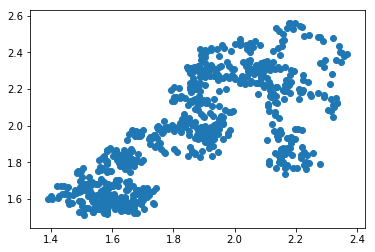

-3.646580534614624


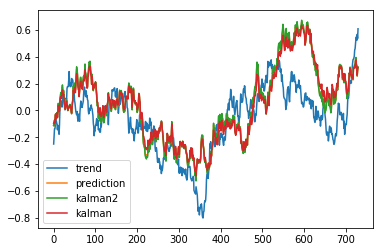

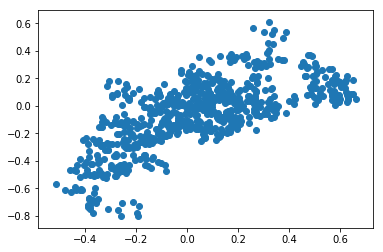

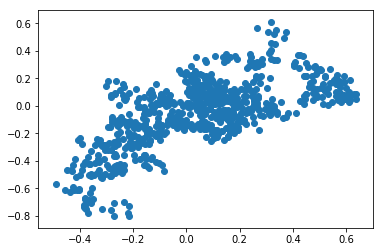

-3.646734039625154


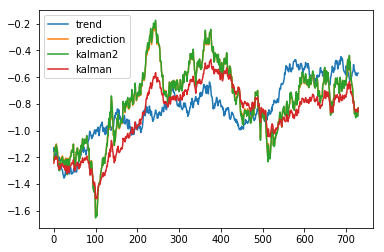

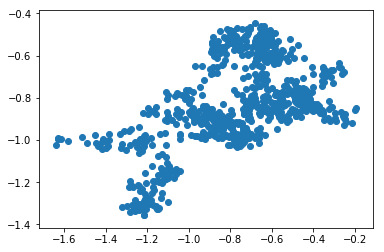

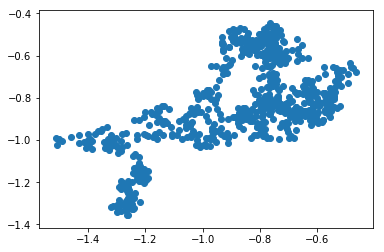

-3.646474247425796


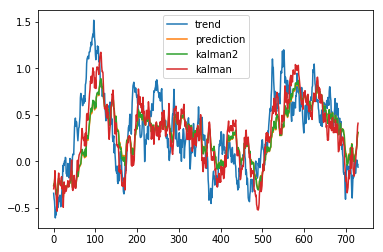

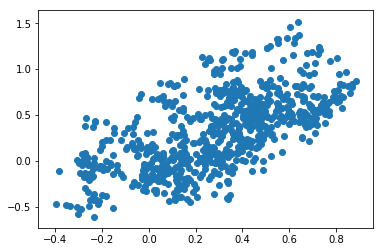

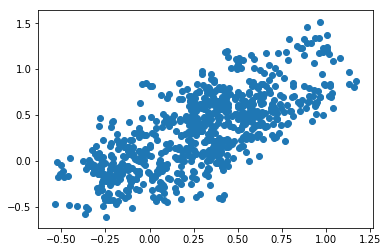

-3.646686688391493


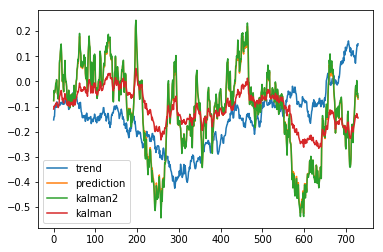

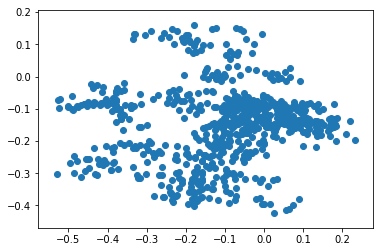

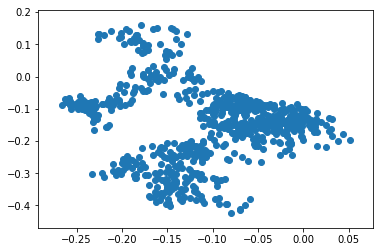

-3.646705545112492


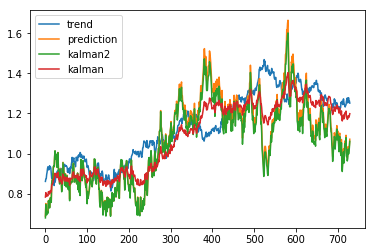

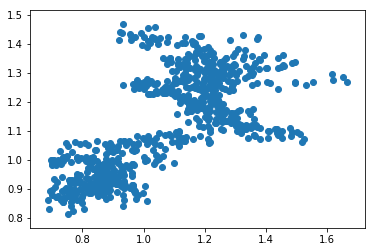

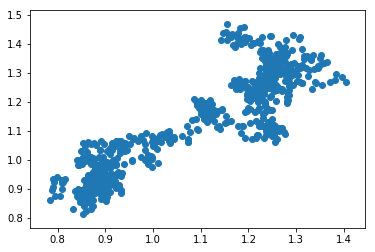

-3.646551812393592


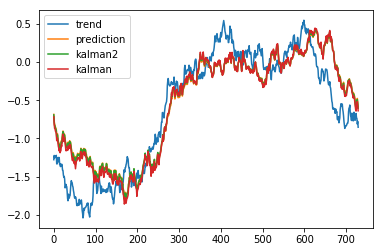

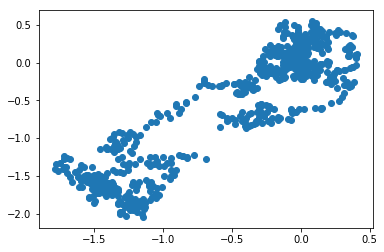

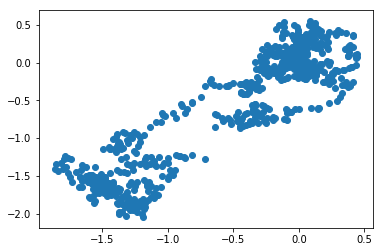

-3.64664401006885


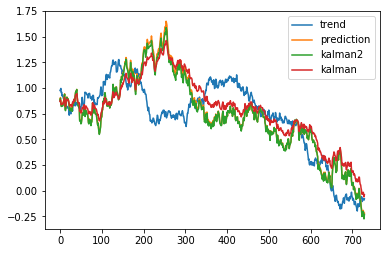

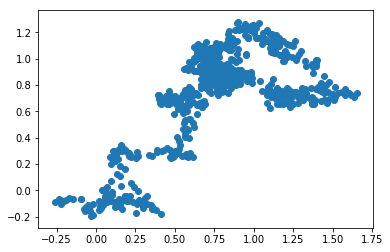

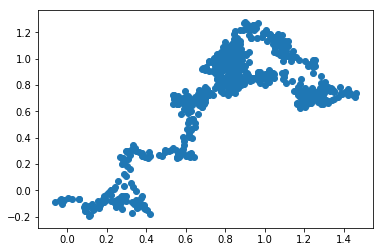

-3.6466508108191205


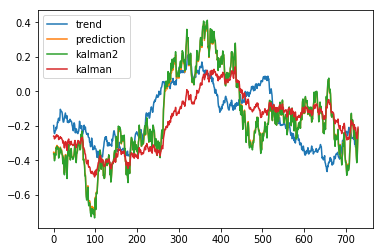

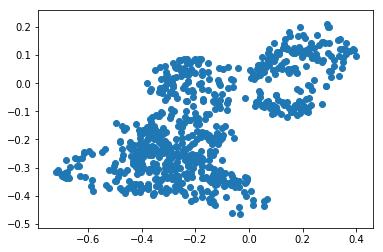

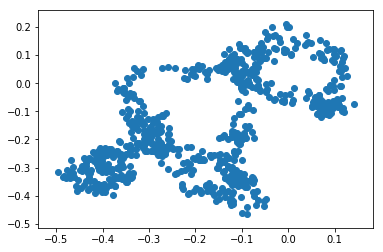

-3.6465707596857113


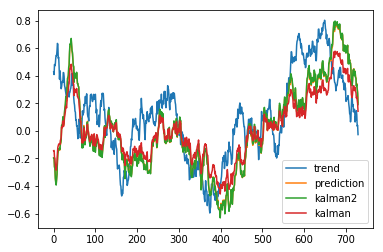

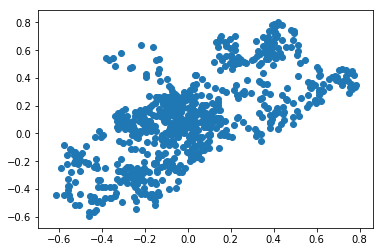

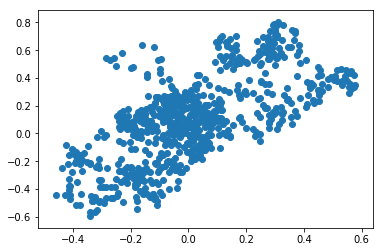

-3.646554222190754


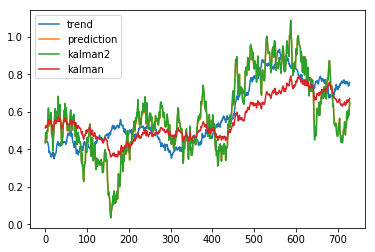

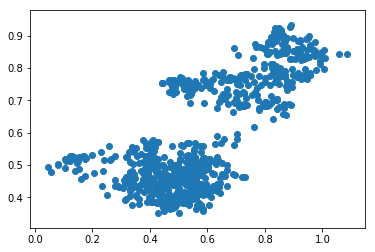

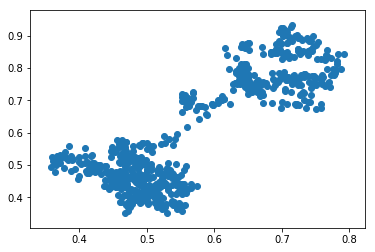

-3.6466107236687106


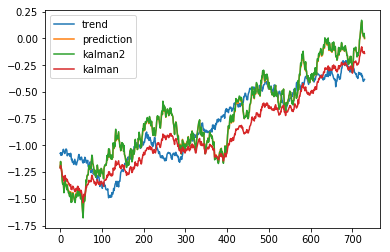

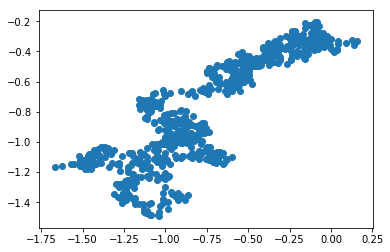

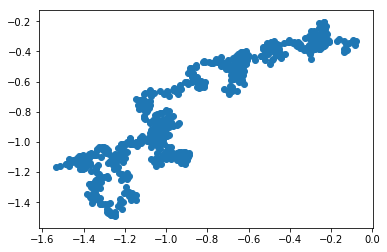

-3.6466728892177356


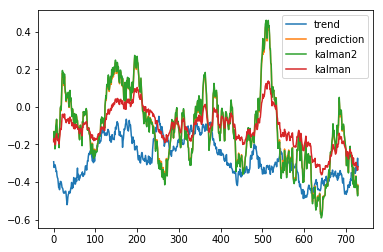

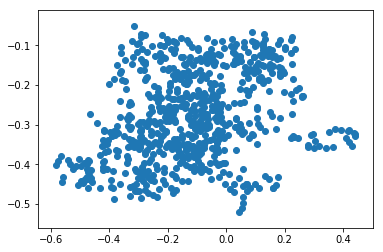

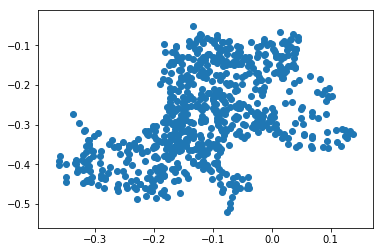

-3.6465254357084644


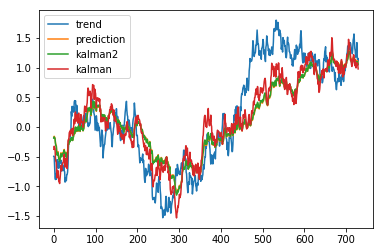

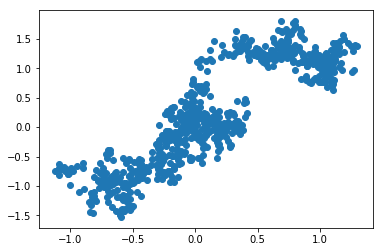

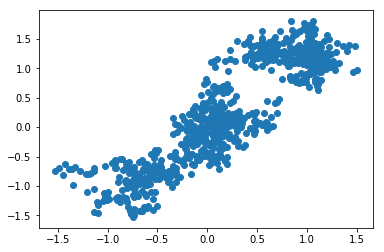

-3.6465592927765114


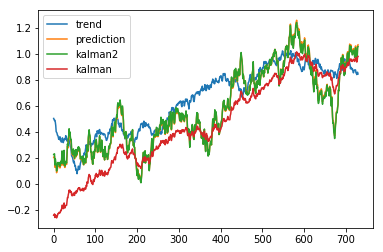

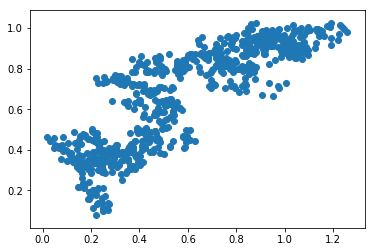

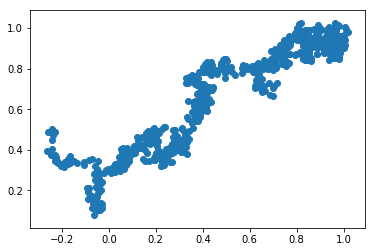

-3.6466437888797385


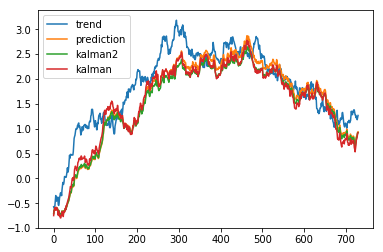

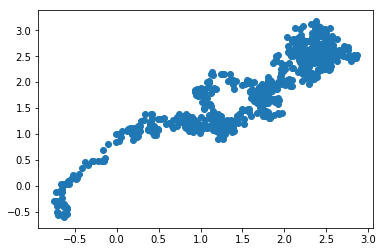

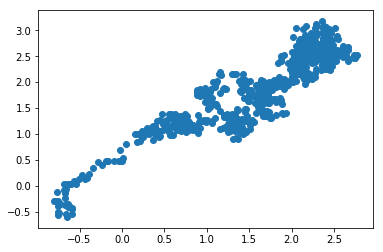

-3.646728135040031


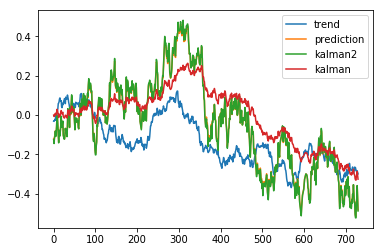

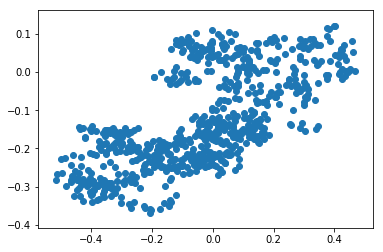

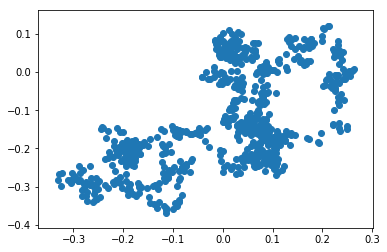

-3.646564563130961


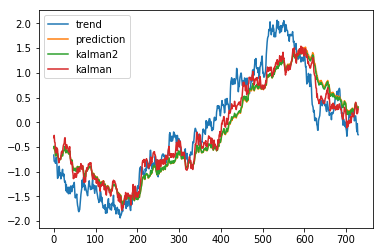

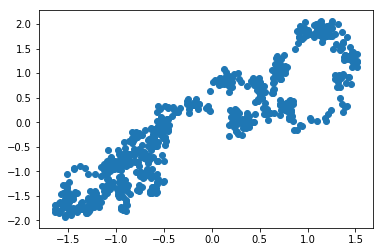

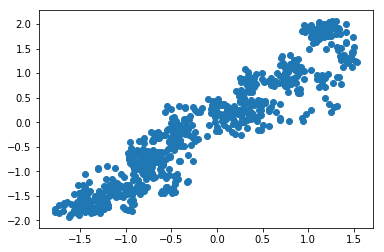

-3.646618806384505


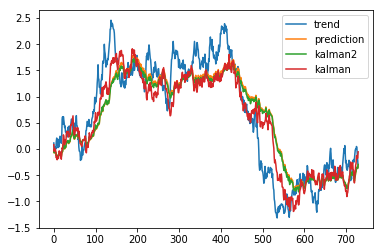

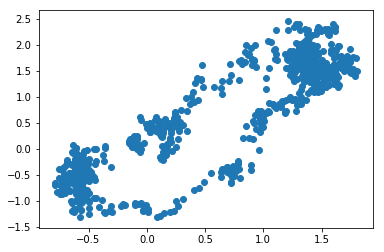

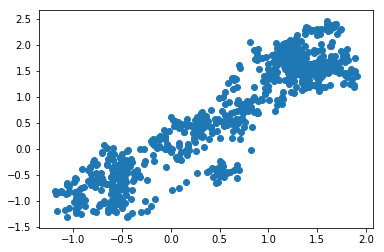

-3.6466903841122997


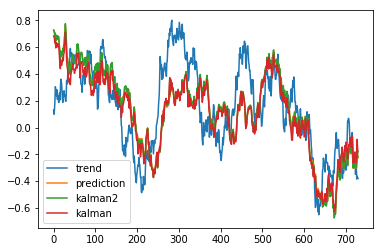

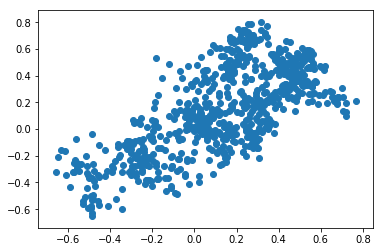

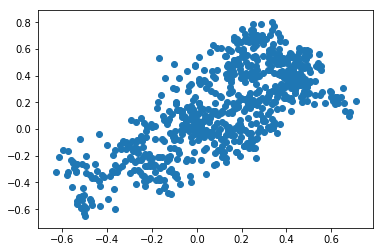

-3.6465718884486717


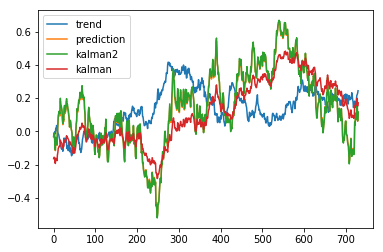

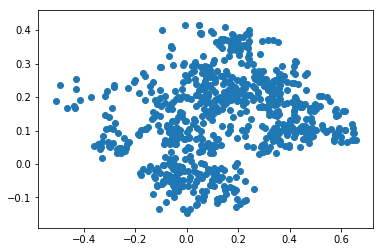

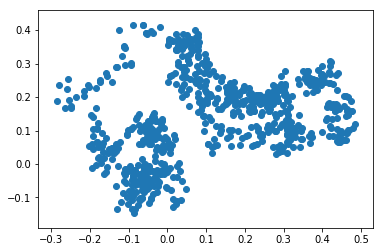

-3.6465641465969396


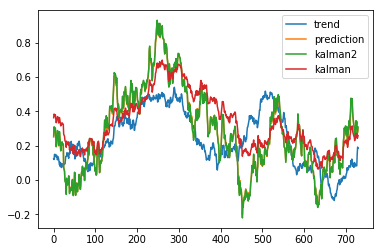

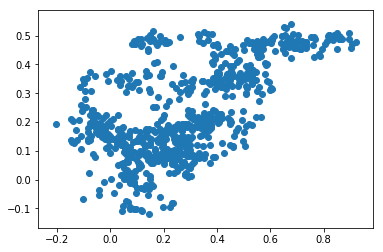

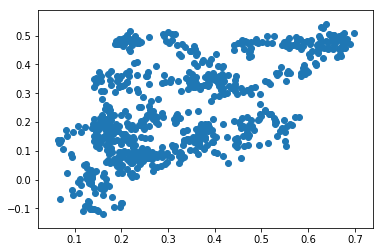

-3.6466829605400575


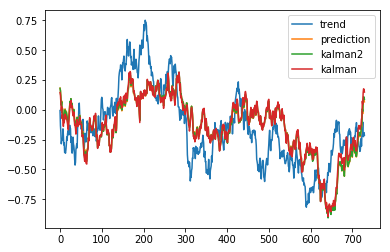

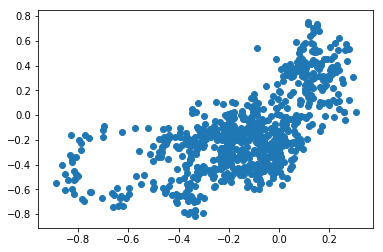

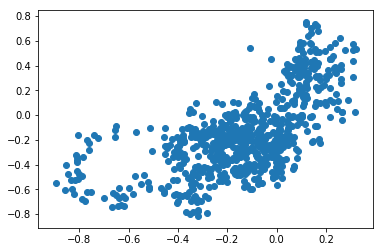

-3.646565431589262


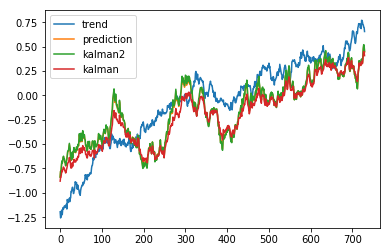

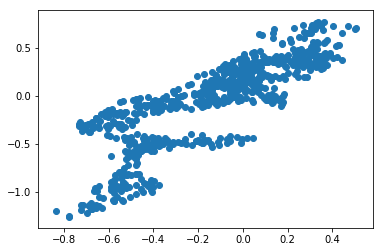

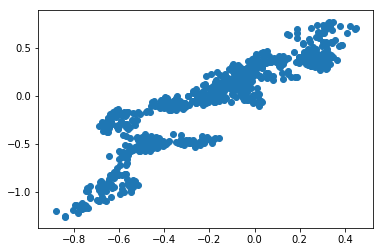

-3.6465096374508006


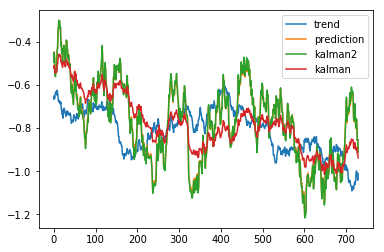

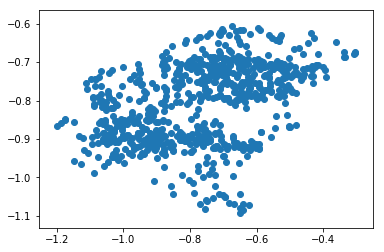

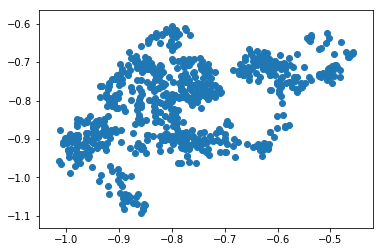

-3.6464611262548727


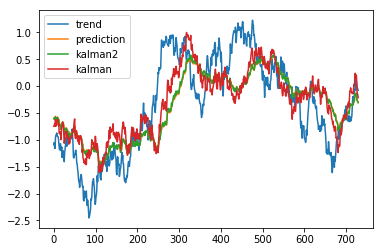

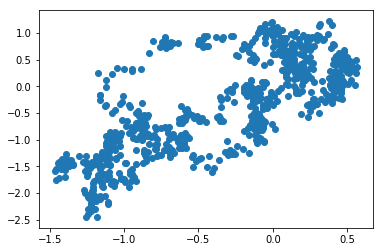

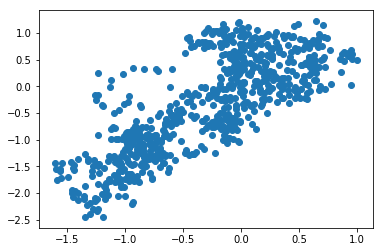

-3.646592594543473


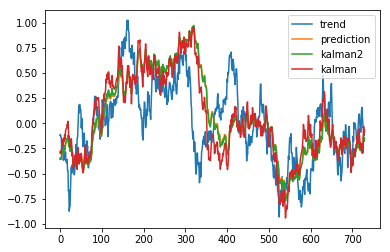

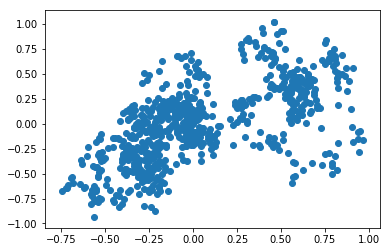

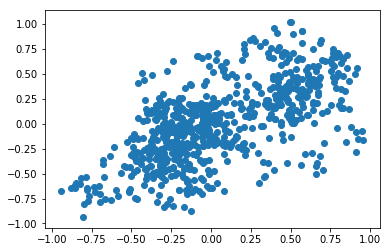

-3.6465275898575795


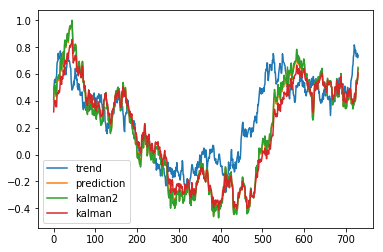

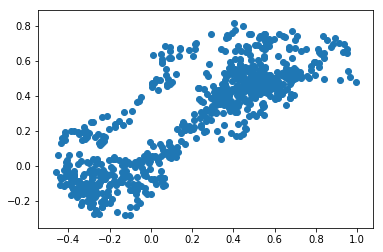

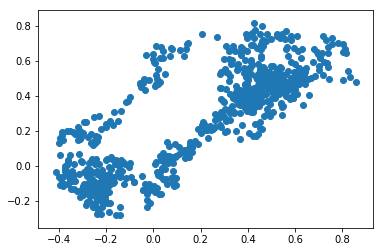

-3.6466704063117517


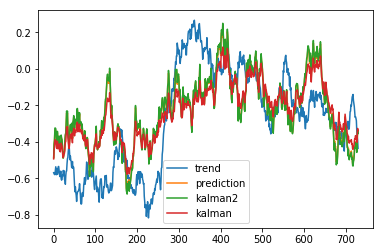

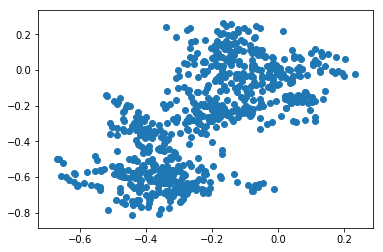

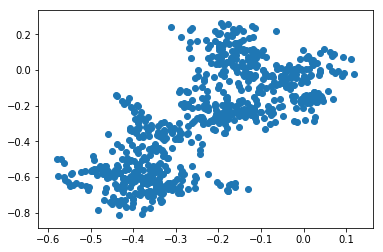

-3.6467018524184835


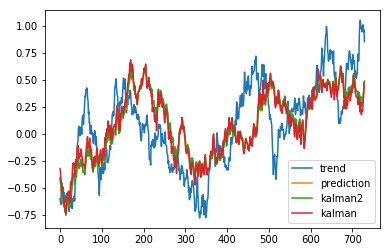

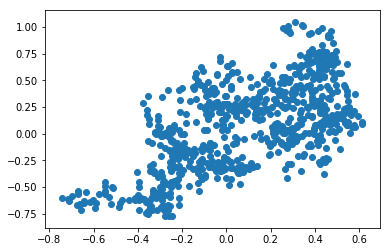

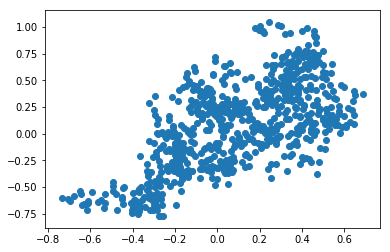

-3.6468321430496884


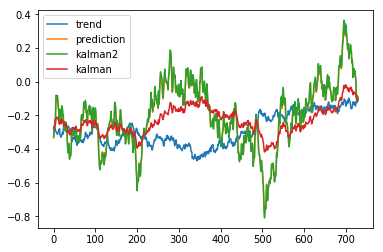

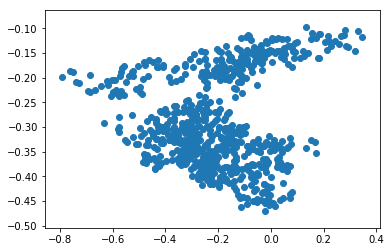

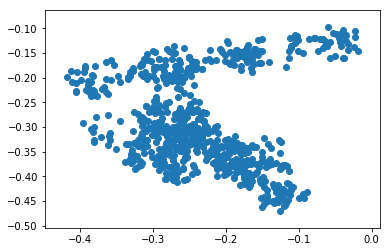

-3.6466591007541878


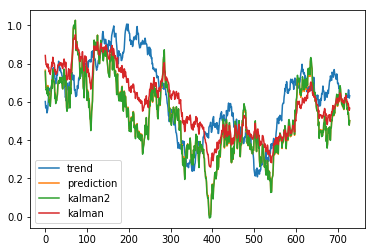

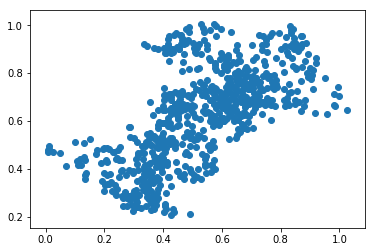

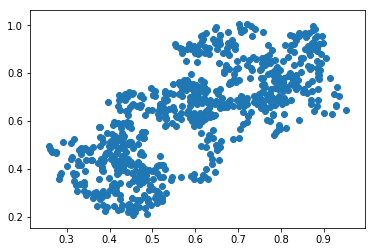

-3.646667646337302


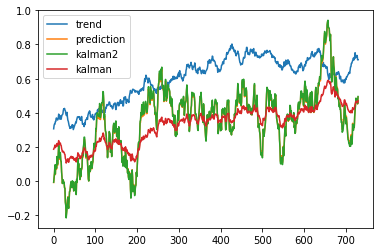

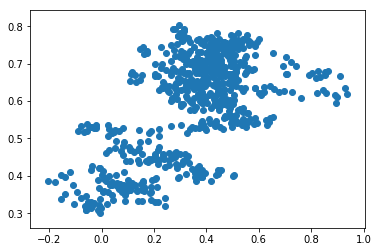

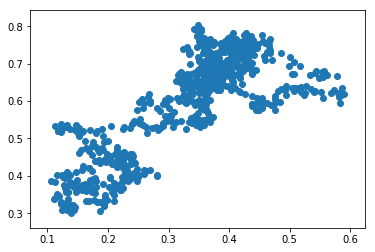

-3.6466535759158445


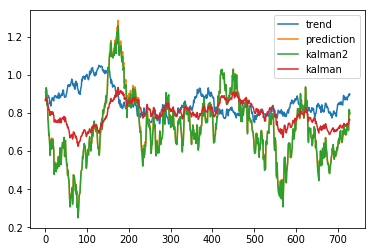

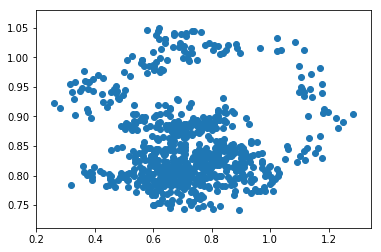

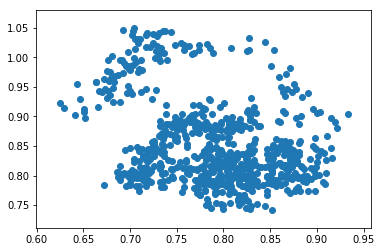

-3.6466391460038734


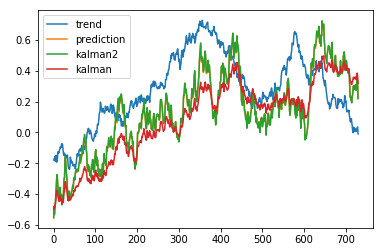

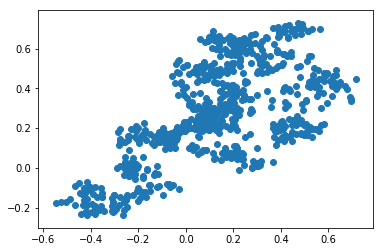

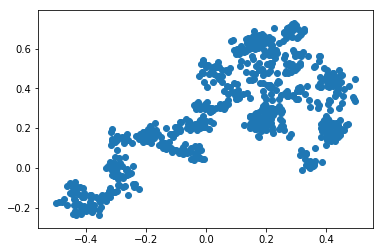

-3.6465246308129293


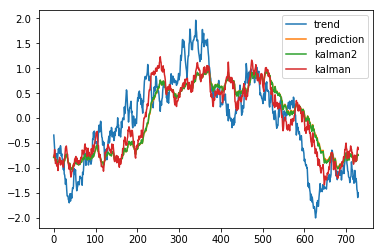

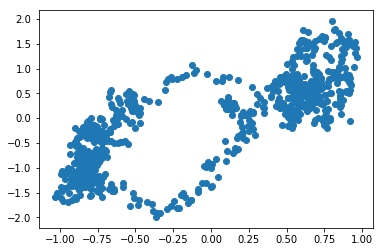

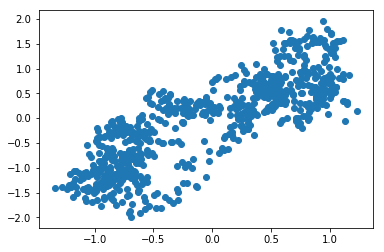

-3.646664383914323


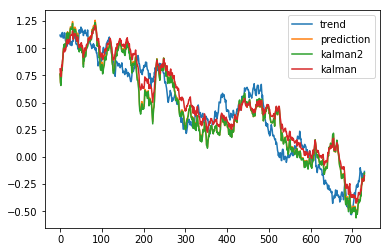

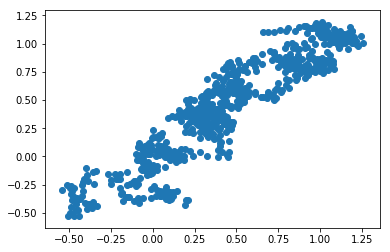

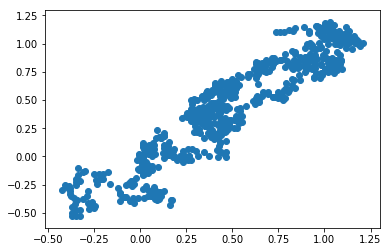

-3.6464982522651566


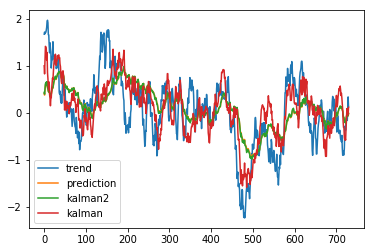

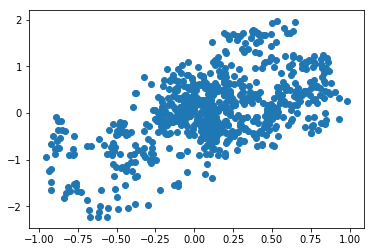

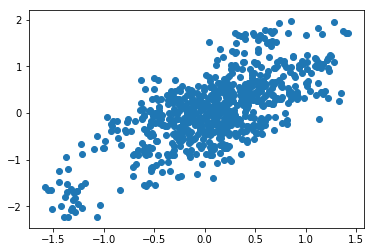

-3.646523563284428


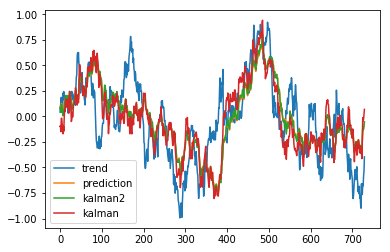

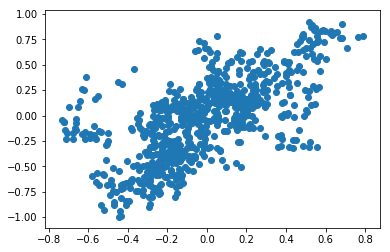

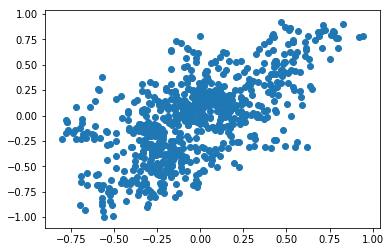

-3.6465739201288683


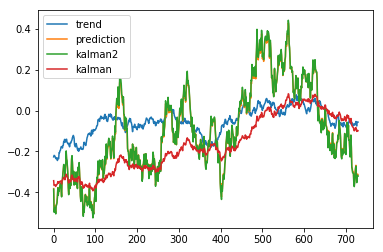

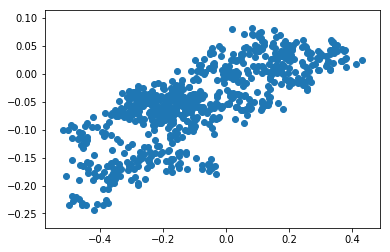

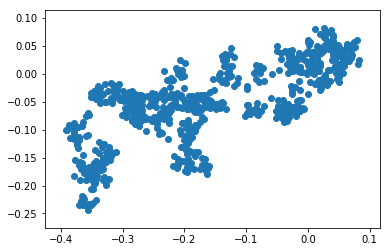

-3.646624213177712


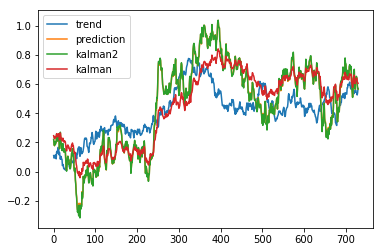

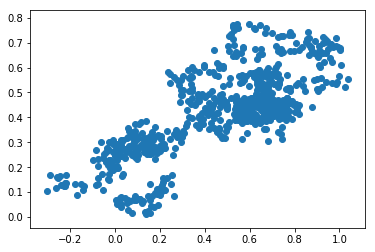

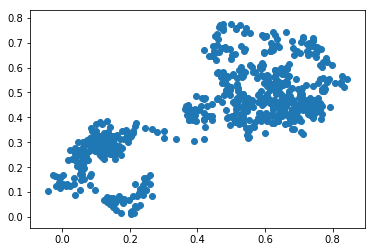

-3.6465343666262937


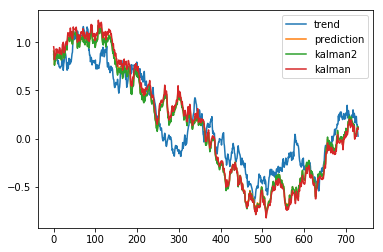

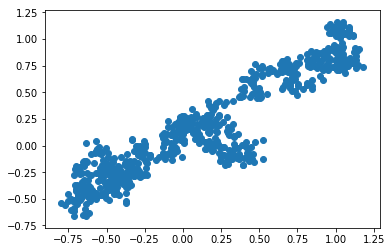

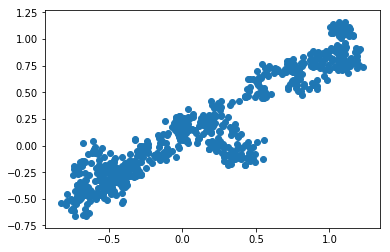

-3.646611891547219


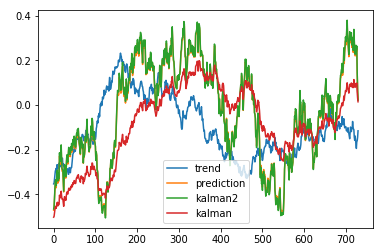

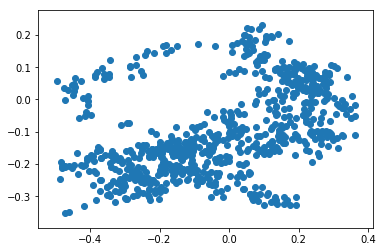

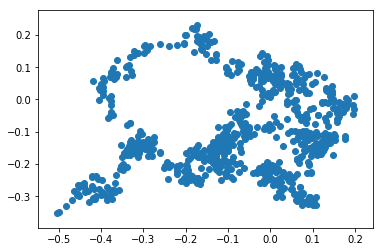

-3.6466627957765025


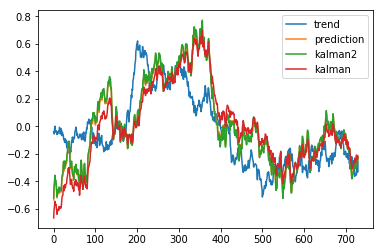

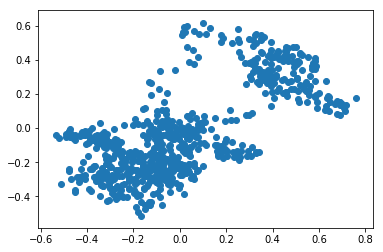

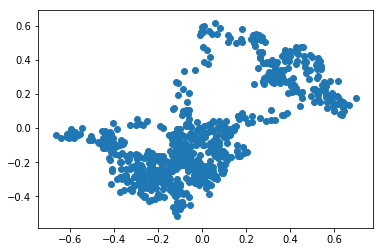

-3.646521749068053


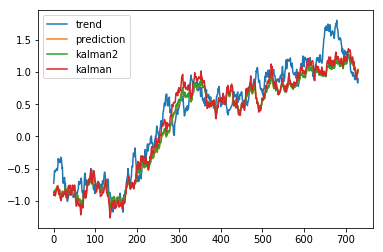

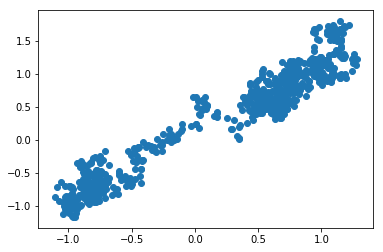

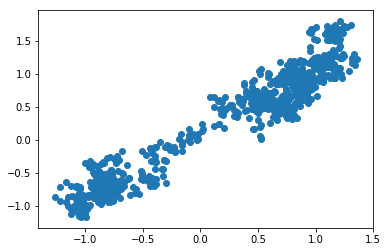

-3.646655953116716


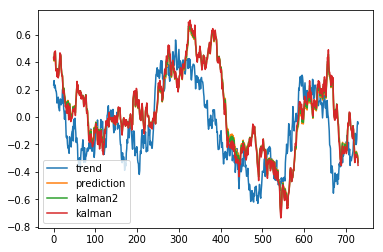

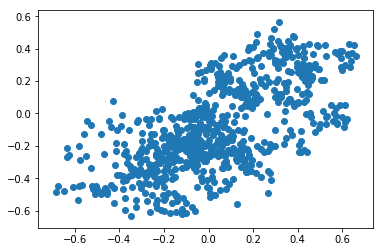

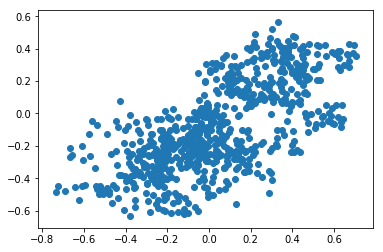

-3.6467057504691196


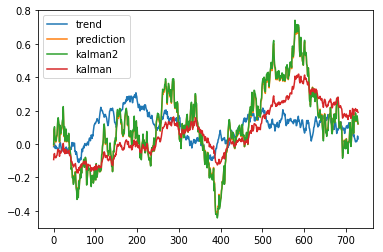

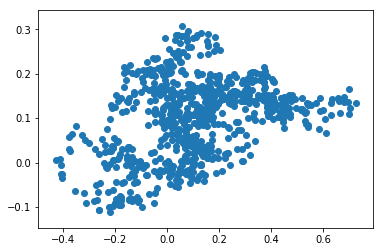

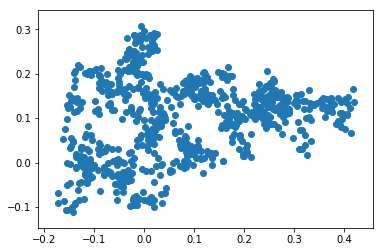

-3.6467338570859296


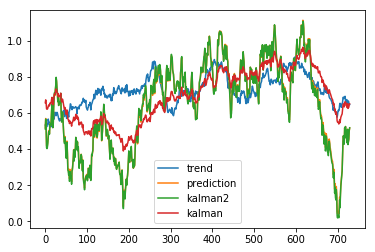

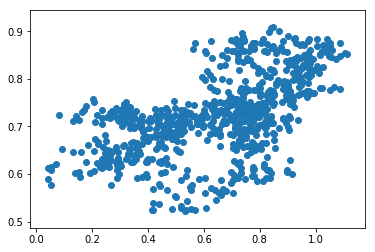

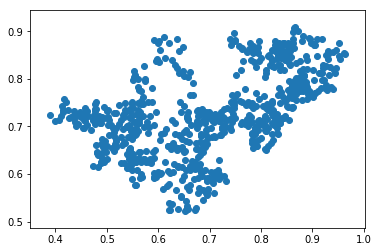

-3.6466584127396358


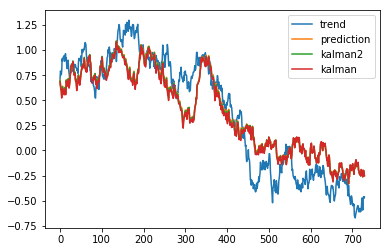

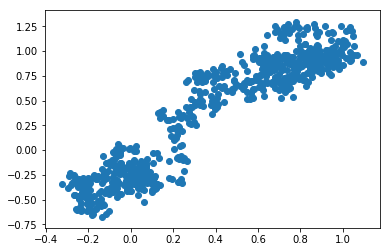

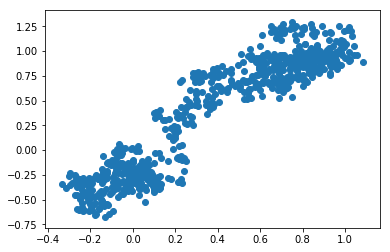

-3.64659836664796


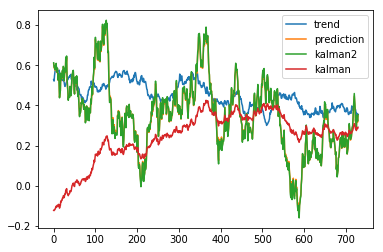

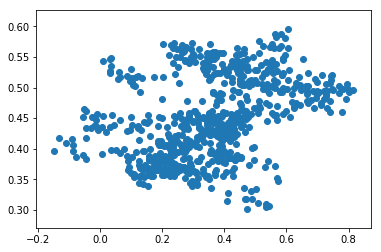

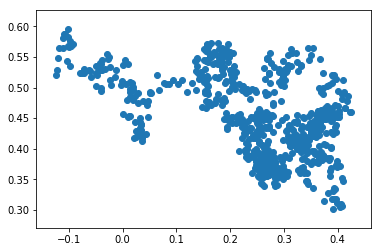

-3.646603235136719


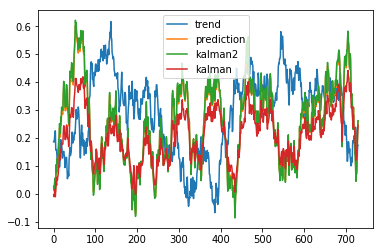

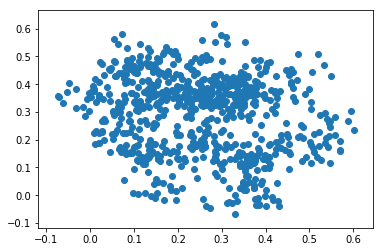

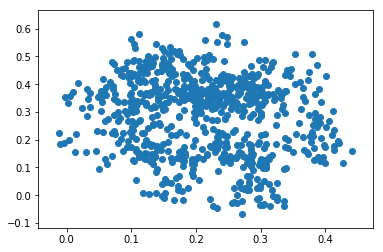

-3.6466422049328697


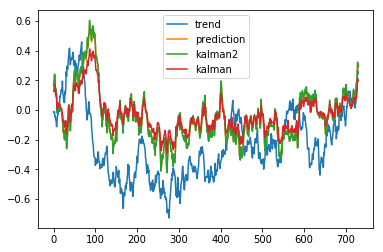

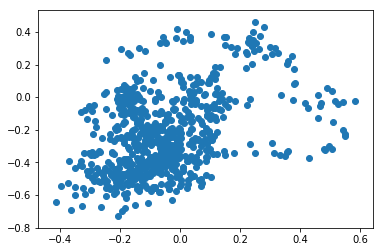

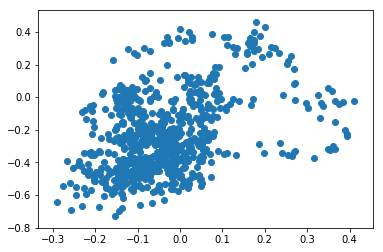

-3.646621619211511


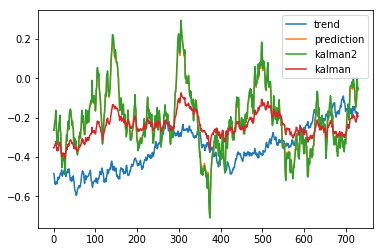

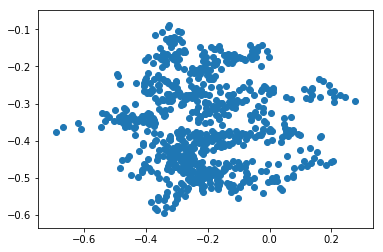

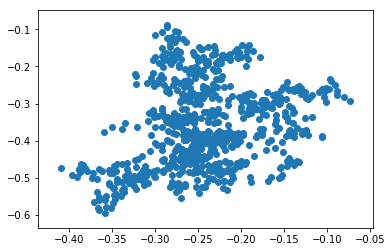

-3.6466394223738474


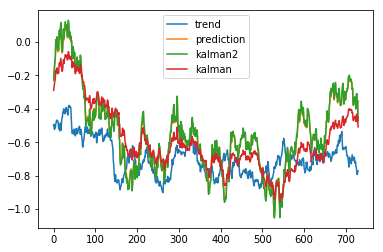

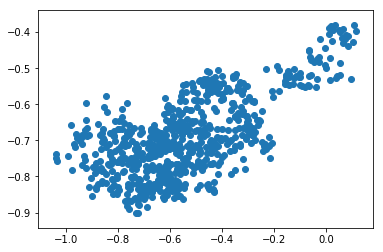

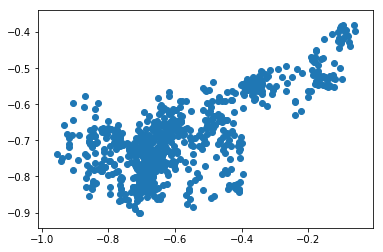

-3.6466371206101043


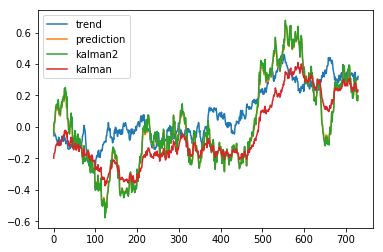

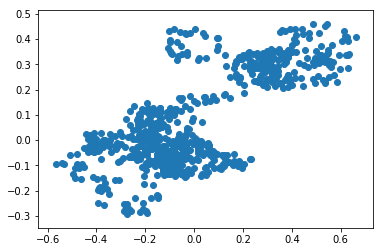

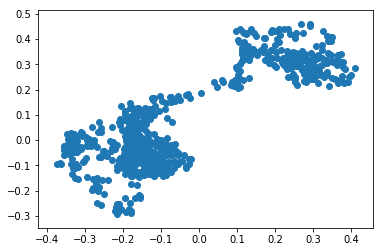

-3.6466777295339865


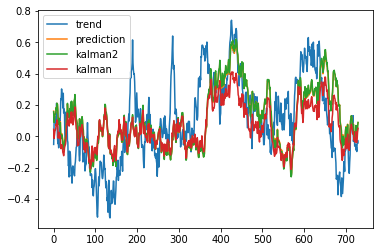

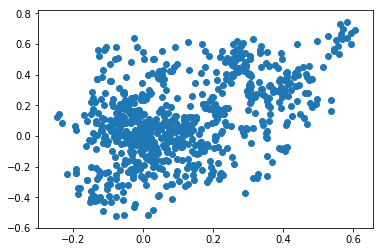

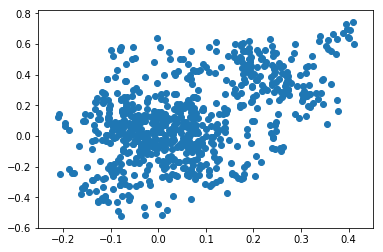

-3.646656718431042


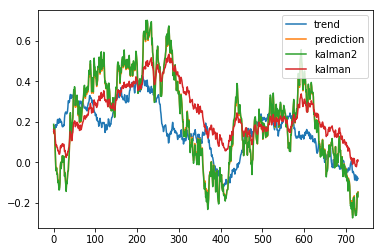

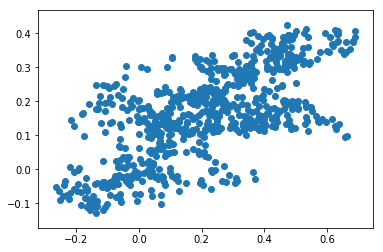

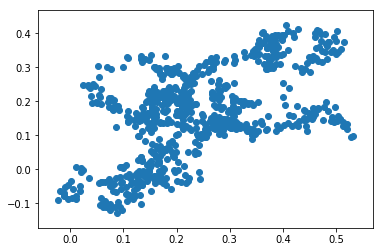

-3.6467663120478404


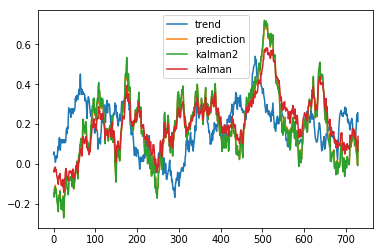

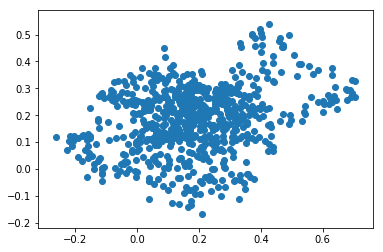

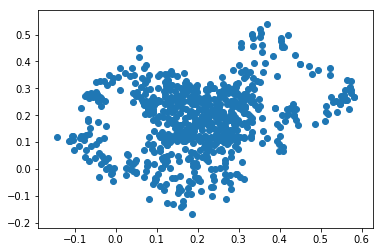

-3.6464656322263194


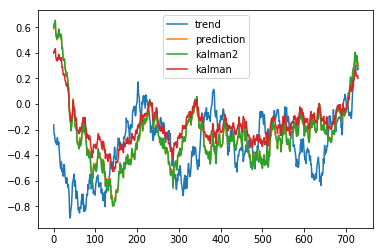

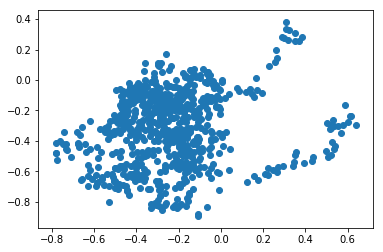

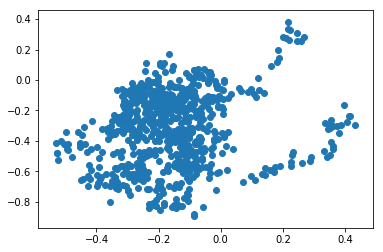

-3.646514700353147


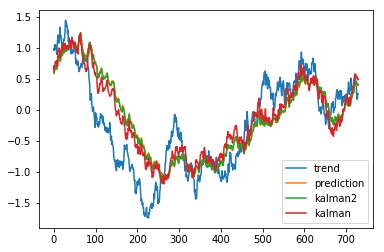

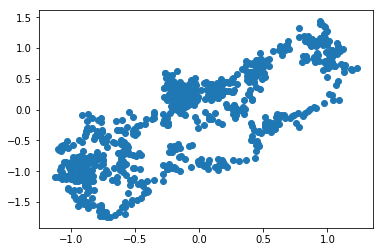

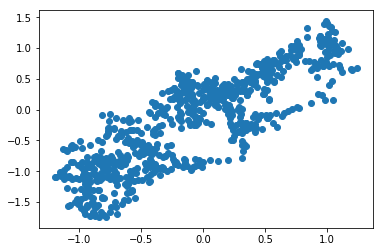

-3.646571599505843


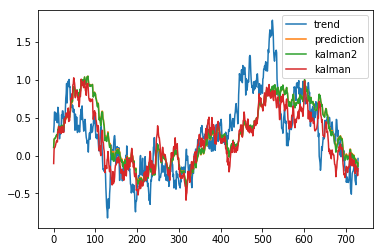

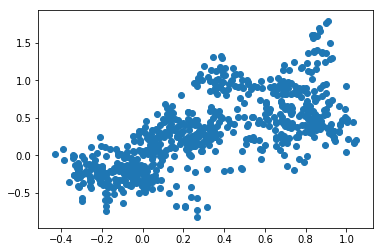

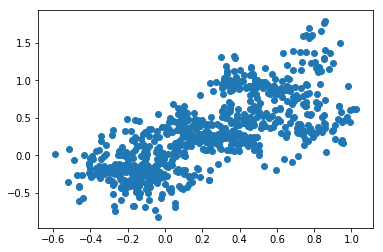

-3.6466172936838133


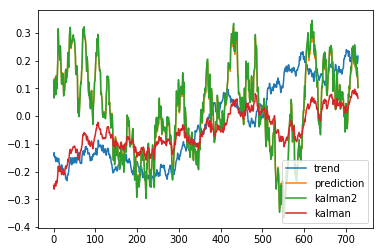

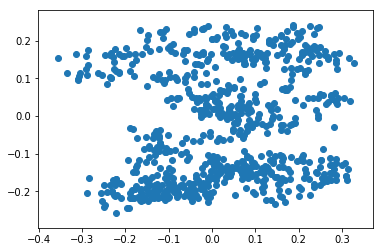

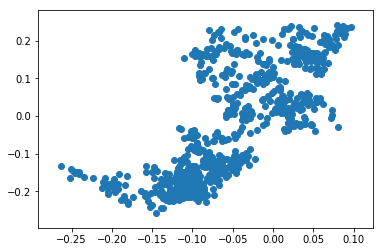

In [11]:
writer = tf.summary.FileWriter(logs_dir, graph)
lrate = 0.001
with tf.Session(graph=graph) as sess:
    sess.run(tf.global_variables_initializer())
    for i in range(3000):
        X,Y ,trends, dicti= next(generator)
        state = sess.run( initial_state)
        variables =tf.trainable_variables()
        if i==1500:
            lrate /= 3.
        
        if i==2250:
            lrate /= 3.
        feed = { inputs_: X,
                initial_state :state,
               targets_: Y ,
               learning_rate: lrate,
               grad_clip: 0.1}
        if (i+1) %100 == 0 :
            result = sess.run( [cost, outputs], feed_dict=feed)
            print( result[0]-noise**2)
            plt.plot( trends[1:,0][start:], label='trend')
            plt.plot( result[1][0,:,0][start:] , label='prediction')

            index=0
            lbd = 1
            sigma = 0.9
            sigmaS= 0.1
            deltaT= 1./365
            kalman_result =  kalman.kalman_estimate( X[index, :,0] ,
                                             sigmaS =sigmaS ,
                                             lbd=lbd,
                                             sigmamu= sigma,
                                             deltaT=deltaT )
            plt.plot(kalman_result[start:], label='kalman2' )

            kalman_result =  kalman.kalman_estimate( X[0, :,0] ,
                                                    sigmaS =noise/np.sqrt(365.) ,
                                                    lbd=dicti['lbd'],
                                                    sigmamu= dicti['sigma'],
                                                    deltaT=dicti['deltaT'] )
            plt.plot(kalman_result[start:], label='kalman' )
            plt.legend( loc='best')
            plt.show()
            plt.scatter( result[1][0,start:,0], trends[1:,0][start:])
            plt.show()
            plt.scatter( kalman_result[start:], trends[1:,0][start:])
            plt.show()
        sess.run( [optimizer], feed_dict=feed)
        ## print result
    for i in range(100):
        X,Y ,trends, dicti= next(generator)
        state = sess.run( initial_state)
        feed = { inputs_: X,
                initial_state :state,
               targets_: Y ,
               learning_rate: 0.001,
               grad_clip: 0.1}
        if i> -1 :
            result = sess.run( [cost, outputs], feed_dict=feed)
            print( result[0]-noise**2)
            plt.plot( trends[1:,0][start:], label='trend')
            plt.plot( result[1][0,:,0][start:] , label='prediction')

            index=0
            lbd = 1
            sigma = 0.9
            sigmaS= 0.1
            deltaT= 1./365
            kalman_result =  kalman.kalman_estimate( X[index, :,0] ,
                                             sigmaS =sigmaS ,
                                             lbd=lbd,
                                             sigmamu= sigma,
                                             deltaT=deltaT )
            plt.plot(kalman_result[start:], label='kalman2' )

            kalman_result =  kalman.kalman_estimate( X[0, :,0] ,
                                                    sigmaS =noise/np.sqrt(365.) ,
                                                    lbd=dicti['lbd'],
                                                    sigmamu= dicti['sigma'],
                                                    deltaT=dicti['deltaT'] )
            plt.plot(kalman_result[start:], label='kalman' )
            plt.legend( loc='best')
            plt.show()
            plt.scatter( result[1][0,start:,0], trends[1:,0][start:])
            plt.show()
            plt.scatter( kalman_result[start:], trends[1:,0][start:])
            plt.show()
        

writer.close()   

In [12]:
len(kalman_result[start:])

730

In [13]:
dicti

{'T': 3,
 'deltaT': 0.0027397260273972603,
 'lbd': 0.10274740809124329,
 'sigma': 0.20396571482944076}

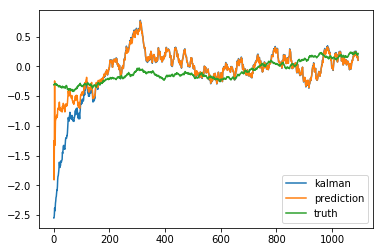

In [14]:
index=0
lbd = 1
sigma = 0.9
sigmaS= 0.1
deltaT= 1./365
kalman_result =  kalman.kalman_estimate( X[index, :,0] ,
                                 sigmaS =sigmaS ,
                                 lbd=lbd,
                                 sigmamu= sigma,
                                 deltaT=deltaT )
plt.plot(kalman_result, label='kalman' )
#plt.plot(X[index,:,0])
plt.plot( result[1][index,:,0] , label = 'prediction')
plt.plot( trends[1:,0] , label= 'truth')
plt.legend( loc='best')
plt.show()

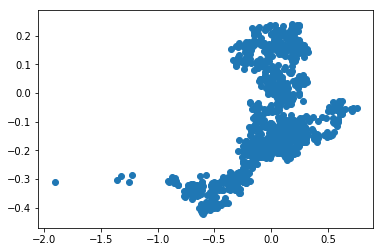

In [15]:
plt.scatter( result[1][0,:,0], trends[1:,0])
plt.show()

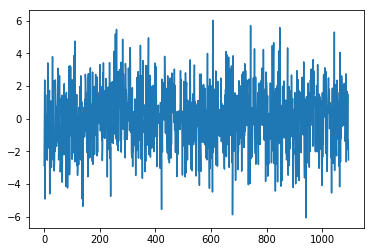

In [16]:
plt.plot(Y[0,:,0])
plt.show()